In [2]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install numpy

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


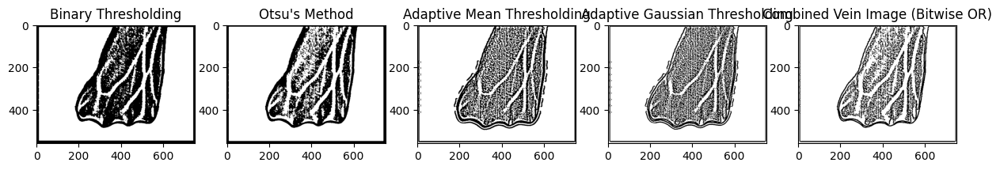

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the original color image
color_image = cv2.imread(r"D:\Documents\vein_mask.jpg")

# Convert color image to grayscale
gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian smoothing
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Thresholding methods
_, binary_thresh = cv2.threshold(blurred_image, 120, 255, cv2.THRESH_BINARY)
_, otsu_thresh = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptive_mean_thresh = cv2.adaptiveThreshold(blurred_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
adaptive_gaussian_thresh = cv2.adaptiveThreshold(blurred_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

# Perform bitwise OR operation on the binary images
combined_vein_image = cv2.bitwise_or(binary_thresh, otsu_thresh)
combined_vein_image = cv2.bitwise_or(combined_vein_image, adaptive_mean_thresh)
combined_vein_image = cv2.bitwise_or(combined_vein_image, adaptive_gaussian_thresh)

# Visualize the thresholded images and the combined vein image
plt.figure(figsize=(15, 5))

plt.subplot(151)
plt.imshow(binary_thresh, cmap='gray')
plt.title('Binary Thresholding')

plt.subplot(152)
plt.imshow(otsu_thresh, cmap='gray')
plt.title("Otsu's Method")

plt.subplot(153)
plt.imshow(adaptive_mean_thresh, cmap='gray')
plt.title('Adaptive Mean Thresholding')

plt.subplot(154)
plt.imshow(adaptive_gaussian_thresh, cmap='gray')
plt.title('Adaptive Gaussian Thresholding')

plt.subplot(155)
plt.imshow(combined_vein_image, cmap='gray')
plt.title('Combined Vein Image (Bitwise OR)')

plt.show()


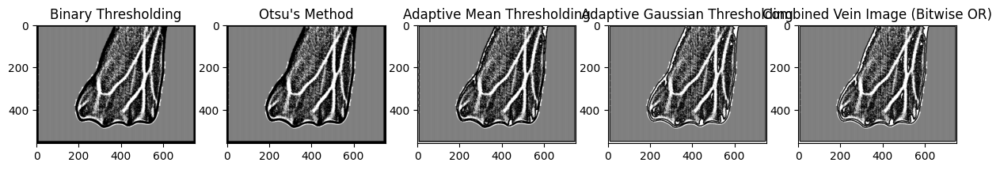

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the original binary mask image
binary_mask = cv2.imread(r"D:\Documents\vein_mask.jpg", cv2.IMREAD_GRAYSCALE)

# Thresholding methods (skip Gaussian smoothing)
_, binary_thresh = cv2.threshold(binary_mask, 120, 255, cv2.THRESH_BINARY)
_, otsu_thresh = cv2.threshold(binary_mask, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptive_mean_thresh = cv2.adaptiveThreshold(binary_mask, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
adaptive_gaussian_thresh = cv2.adaptiveThreshold(binary_mask, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

# Perform bitwise OR operation on the binary images
combined_vein_image = cv2.bitwise_or(binary_thresh, otsu_thresh)
combined_vein_image = cv2.bitwise_or(combined_vein_image, adaptive_mean_thresh)
combined_vein_image = cv2.bitwise_or(combined_vein_image, adaptive_gaussian_thresh)

# Visualize the thresholded images and the combined vein image
plt.figure(figsize=(15, 5))

plt.subplot(151)
plt.imshow(binary_thresh, cmap='gray')
plt.title('Binary Thresholding')

plt.subplot(152)
plt.imshow(otsu_thresh, cmap='gray')
plt.title("Otsu's Method")

plt.subplot(153)
plt.imshow(adaptive_mean_thresh, cmap='gray')
plt.title('Adaptive Mean Thresholding')

plt.subplot(154)
plt.imshow(adaptive_gaussian_thresh, cmap='gray')
plt.title('Adaptive Gaussian Thresholding')

plt.subplot(155)
plt.imshow(combined_vein_image, cmap='gray')
plt.title('Combined Vein Image (Bitwise OR)')

plt.show()


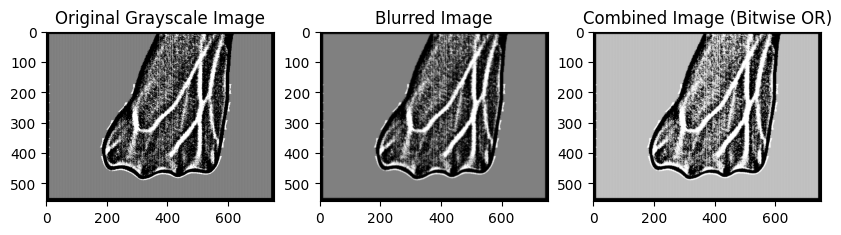

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the original color image
color_image = cv2.imread(r"D:\Documents\vein_mask.jpg")

# Convert color image to grayscale
gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian smoothing
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Perform bitwise OR operation on the images after Gaussian smoothing
combined_vein_image = cv2.bitwise_or(blurred_image, gray_image)

# Visualize the original image, smoothed images, and the combined image
plt.figure(figsize=(10, 5))

plt.subplot(131)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Grayscale Image')

plt.subplot(132)
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image')

plt.subplot(133)
plt.imshow(combined_vein_image, cmap='gray')
plt.title('Combined Image (Bitwise OR)')

plt.show()


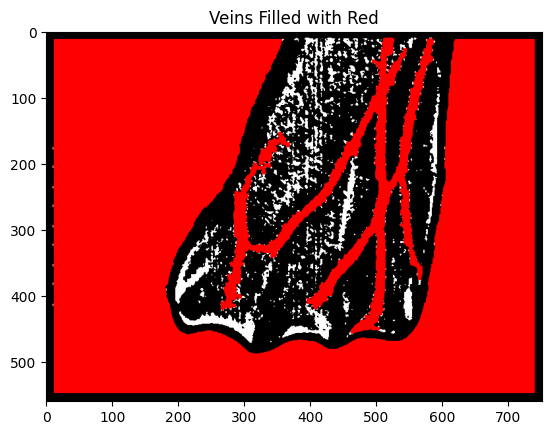

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the original color image
color_image = cv2.imread(r"C:\Users\sudhi\binary_thresh_image.jpg")

# Convert color image to grayscale
gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian smoothing
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Thresholding methods
_, binary_thresh = cv2.threshold(blurred_image, 120, 255, cv2.THRESH_BINARY)

# Morphological operations to remove noise
kernel = np.ones((5, 5), np.uint8)
cleaned_binary_thresh = cv2.morphologyEx(binary_thresh, cv2.MORPH_OPEN, kernel)

# Find contours to identify connected components
contours, _ = cv2.findContours(cleaned_binary_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter out small contours (noise) and create a mask for the veins
vein_mask = np.zeros_like(cleaned_binary_thresh)
for contour in contours:
    area = cv2.contourArea(contour)
    if area > 1500:  # Adjust this threshold based on the size of the veins
        cv2.drawContours(vein_mask, [contour], -1, 255, -1)

# Create a red mask for filling
red_mask = np.zeros_like(color_image)
red_mask[:] = (0, 0, 255)  # Set red color

# Fill white areas (veins) with red
filled_image = np.where(vein_mask[..., None], red_mask, color_image)

# Visualize the result
plt.imshow(cv2.cvtColor(filled_image, cv2.COLOR_BGR2RGB))
plt.title('Veins Filled with Red')
plt.show()


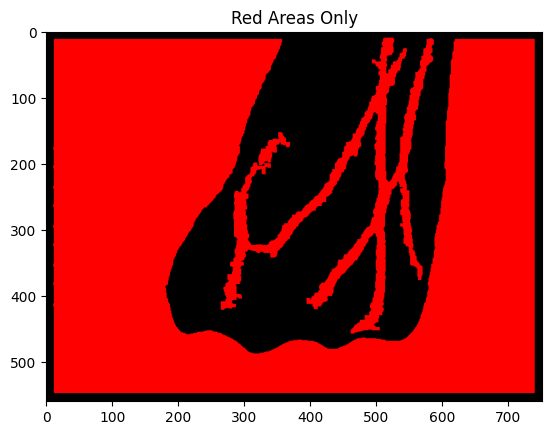

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the original color image
color_image = cv2.imread(r"C:\Users\sudhi\binary_thresh_image.jpg")

# Convert color image to grayscale
gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian smoothing
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Thresholding methods
_, binary_thresh = cv2.threshold(blurred_image, 120, 255, cv2.THRESH_BINARY)

# Morphological operations to remove noise
kernel = np.ones((5, 5), np.uint8)
cleaned_binary_thresh = cv2.morphologyEx(binary_thresh, cv2.MORPH_OPEN, kernel)

# Find contours to identify connected components
contours, _ = cv2.findContours(cleaned_binary_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter out small contours (noise) and create a mask for the veins
vein_mask = np.zeros_like(cleaned_binary_thresh)
for contour in contours:
    area = cv2.contourArea(contour)
    if area > 1500:  # Adjust this threshold based on the size of the veins
        cv2.drawContours(vein_mask, [contour], -1, 255, -1)

# Create a red mask for filling
red_mask = np.zeros_like(color_image)
red_mask[:] = (0, 0, 255)  # Set red color

# Fill white areas (veins) with red
filled_image = np.where(vein_mask[..., None], red_mask, color_image)

# Convert to HSV color space
hsv_image = cv2.cvtColor(filled_image, cv2.COLOR_BGR2HSV)

# Define lower and upper bounds for red color in HSV
lower_red = np.array([0, 100, 100])
upper_red = np.array([10, 255, 255])

# Create a mask for red color
red_mask = cv2.inRange(hsv_image, lower_red, upper_red)

# Apply bitwise AND operation to retain only red areas
red_only = cv2.bitwise_and(filled_image, filled_image, mask=red_mask)

# Visualize the result
plt.imshow(cv2.cvtColor(red_only, cv2.COLOR_BGR2RGB))
plt.title('Red Areas Only')
plt.show()


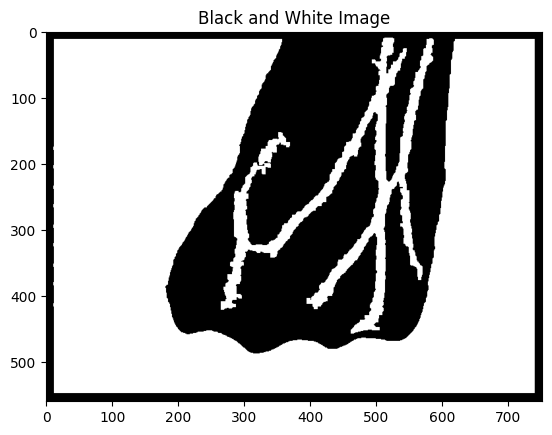

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the original color image
color_image = cv2.imread(r"C:\Users\sudhi\binary_thresh_image.jpg")

# Convert color image to grayscale
gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian smoothing
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Thresholding methods
_, binary_thresh = cv2.threshold(blurred_image, 120, 255, cv2.THRESH_BINARY)

# Morphological operations to remove noise
kernel = np.ones((5, 5), np.uint8)
cleaned_binary_thresh = cv2.morphologyEx(binary_thresh, cv2.MORPH_OPEN, kernel)

# Find contours to identify connected components
contours, _ = cv2.findContours(cleaned_binary_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter out small contours (noise) and create a mask for the veins
vein_mask = np.zeros_like(cleaned_binary_thresh)
for contour in contours:
    area = cv2.contourArea(contour)
    if area > 1500:  # Adjust this threshold based on the size of the veins
        cv2.drawContours(vein_mask, [contour], -1, 255, -1)

# Create a red mask for filling
red_mask = np.zeros_like(color_image)
red_mask[:] = (0, 0, 255)  # Set red color

# Fill white areas (veins) with red
filled_image = np.where(vein_mask[..., None], red_mask, color_image)

# Convert to HSV color space
hsv_image = cv2.cvtColor(filled_image, cv2.COLOR_BGR2HSV)

# Define lower and upper bounds for red color in HSV
lower_red = np.array([0, 100, 100])
upper_red = np.array([10, 255, 255])

# Create a mask for red color
red_mask = cv2.inRange(hsv_image, lower_red, upper_red)

# Apply bitwise AND operation to retain only red areas
red_only = cv2.bitwise_and(filled_image, filled_image, mask=red_mask)

# Convert red areas to white and the rest to black
red_only[np.where((red_only == [0, 0, 255]).all(axis=2))] = [255, 255, 255]
red_only[np.where((red_only != [255, 255, 255]).any(axis=2))] = [0, 0, 0]

# Convert to grayscale
final_image = cv2.cvtColor(red_only, cv2.COLOR_BGR2GRAY)

# Visualize the result
plt.imshow(final_image, cmap='gray')
plt.title('Black and White Image')
plt.show()


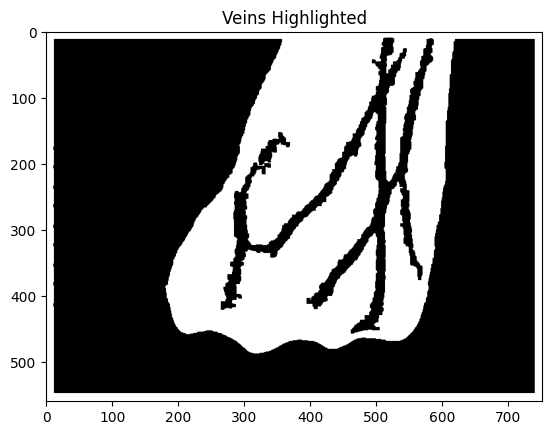

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the original color image
color_image = cv2.imread(r"C:\Users\sudhi\binary_thresh_image.jpg")

# Convert color image to grayscale
gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian smoothing
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Thresholding methods
_, binary_thresh = cv2.threshold(blurred_image, 120, 255, cv2.THRESH_BINARY)

# Morphological operations to remove noise
kernel = np.ones((5, 5), np.uint8)
cleaned_binary_thresh = cv2.morphologyEx(binary_thresh, cv2.MORPH_OPEN, kernel)

# Find contours to identify connected components
contours, _ = cv2.findContours(cleaned_binary_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter out small contours (noise) and create a mask for the veins
vein_mask = np.zeros_like(cleaned_binary_thresh)
for contour in contours:
    area = cv2.contourArea(contour)
    if area > 1500:  # Adjust this threshold based on the size of the veins
        cv2.drawContours(vein_mask, [contour], -1, 255, -1)

# Create a red mask for filling
red_mask = np.zeros_like(color_image)
red_mask[:] = (0, 0, 255)  # Set red color

# Fill white areas (veins) with red
filled_image = np.where(vein_mask[..., None], red_mask, color_image)

# Convert to HSV color space
hsv_image = cv2.cvtColor(filled_image, cv2.COLOR_BGR2HSV)

# Define lower and upper bounds for red color in HSV
lower_red = np.array([0, 100, 100])
upper_red = np.array([10, 255, 255])

# Create a mask for red color
red_mask = cv2.inRange(hsv_image, lower_red, upper_red)

# Apply bitwise AND operation to retain only red areas
red_only = cv2.bitwise_and(filled_image, filled_image, mask=red_mask)

# Convert red areas to white and the rest to black
red_only[np.where((red_only == [0, 0, 255]).all(axis=2))] = [255, 255, 255]
red_only[np.where((red_only != [255, 255, 255]).any(axis=2))] = [0, 0, 0]

# Convert to grayscale
final_image = cv2.cvtColor(red_only, cv2.COLOR_BGR2GRAY)

# Invert the grayscale image
inverted_image = cv2.bitwise_not(final_image)

# Visualize the result
plt.imshow(inverted_image, cmap='gray')
plt.title('Veins Highlighted')
plt.show()


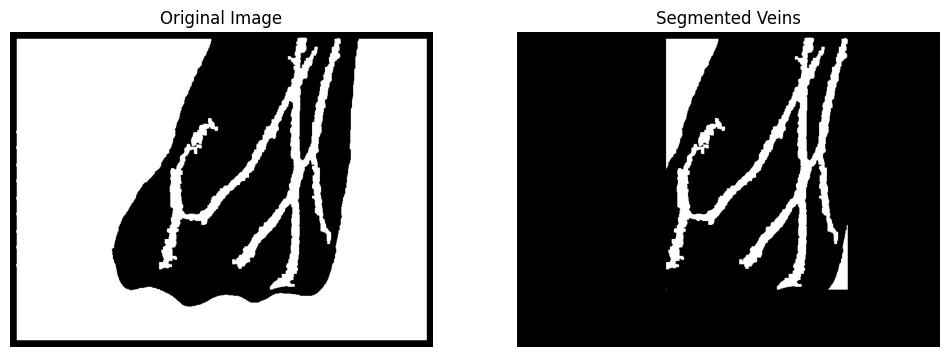

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(image_path):
    # Read the image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Apply Gaussian blur to reduce noise and enhance edges
    img_blur = cv2.GaussianBlur(img, (5, 5), 0)
    
    return img_blur

def segment_veins(image_path):
    # Preprocess the image
    img = preprocess_image(image_path)
    
    # Apply thresholding to segment the veins
    _, thresholded = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Find contours in the binary image
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Get the bounding boxes for all contours
    bounding_boxes = [cv2.boundingRect(contour) for contour in contours]
    
    # Find the smallest bounding box
    min_x, min_y, min_w, min_h = min(bounding_boxes, key=lambda box: box[2] * box[3])
    
    # Create a blank black image
    black_image = np.zeros_like(cv2.imread(image_path))
    
    # Fill the entire image with black
    black_image.fill(0)
    
    # Create a mask for the smallest bounding box
    mask = np.zeros_like(thresholded)
    cv2.rectangle(mask, (min_x, min_y), (min_x + min_w, min_y + min_h), 255, -1)
    
    # Invert the mask to get the regions outside the smallest bounding box
    mask = cv2.bitwise_not(mask)
    
    # Apply the inverted mask to the black image to set areas outside the smallest bounding box to black
    black_image = cv2.bitwise_and(black_image, black_image, mask=mask)
    
    # Fill the region inside the smallest bounding box with the original pixel values
    black_image[min_y:min_y + min_h, min_x:min_x + min_w] = cv2.imread(image_path)[min_y:min_y + min_h, min_x:min_x + min_w]
    
    return black_image

# Example usage
image_path = r"C:\Users\sudhi\black_and_white_image.jpg"
segmented_image = segment_veins(image_path)

# Display the original and segmented images
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(cv2.imread(image_path))
plt.title('Original Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(segmented_image)
plt.title('Segmented Veins')
plt.axis('off')

plt.show()


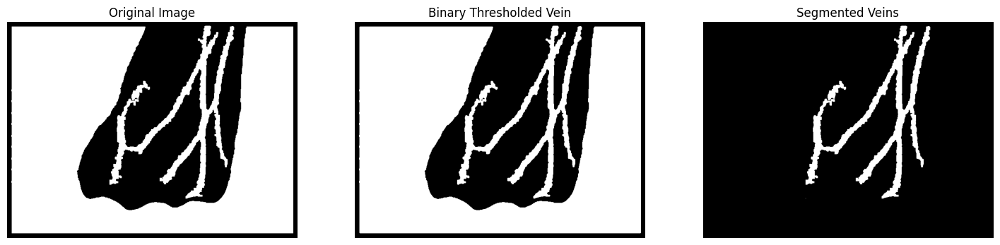

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(image):
    # Apply Gaussian blur to reduce noise and enhance edges
    img_blur = cv2.GaussianBlur(image, (5, 5), 0)
    return img_blur

def segment_veins(image):
    # Preprocess the image
    img = preprocess_image(image)
    
    # Apply thresholding to segment the veins
    _, thresholded = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Find contours in the binary image
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Get the bounding boxes for all contours
    bounding_boxes = [cv2.boundingRect(contour) for contour in contours]
    
    # Find the smallest bounding box
    min_x, min_y, min_w, min_h = min(bounding_boxes, key=lambda box: box[2] * box[3])
    
    # Create a blank black image
    black_image = np.zeros_like(image)
    
    # Fill the region inside the smallest bounding box with the original pixel values
    black_image[min_y:min_y + min_h, min_x:min_x + min_w] = image[min_y:min_y + min_h, min_x:min_x + min_w]
    
    # Create a triangular mask
    triangle_mask = np.ones_like(black_image) * 255
    triangle_vertices_top_left = np.array([[min_x, min_y], [min_x, min_y + 250], [min_x + 130, min_y]], dtype=np.int32)
    triangle_vertices_bottom_right = np.array([[min_x + min_w - 37, min_y + min_h], [min_x + min_w, min_y + min_h], [min_x + min_w, min_y + min_h - 140]], dtype=np.int32)
    
    # Draw the filled triangles
    cv2.drawContours(black_image, [triangle_vertices_top_left, triangle_vertices_bottom_right], -1, (0, 0, 0), thickness=cv2.FILLED)
    
    return thresholded, black_image

# Example usage
image_path = r"C:\Users\sudhi\black_and_white_image.jpg"
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
binary_thresholded, segmented_image = segment_veins(original_image)

# Display the images
plt.figure(figsize=(18, 6))

plt.subplot(131)
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(binary_thresholded, cmap='gray')
plt.title('Binary Thresholded Vein')
plt.axis('off')

plt.subplot(133)
plt.imshow(segmented_image, cmap='gray')
plt.title('Segmented Veins')
plt.axis('off')

plt.show()


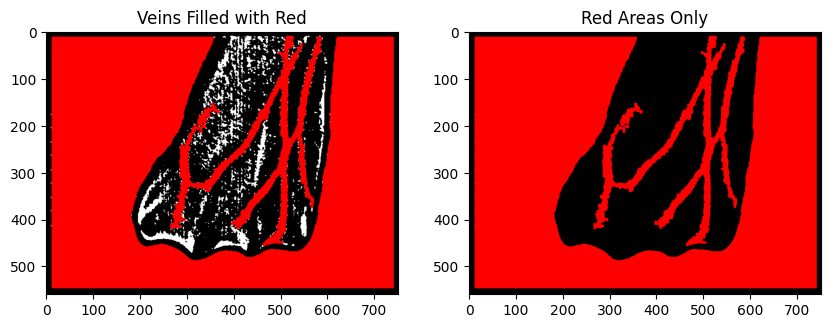

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the original color image
color_image = cv2.imread(r"C:\Users\sudhi\binary_thresh_image.jpg")

# Convert color image to grayscale
gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian smoothing
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Thresholding methods
_, binary_thresh = cv2.threshold(blurred_image, 120, 255, cv2.THRESH_BINARY)

# Morphological operations to remove noise
kernel = np.ones((5, 5), np.uint8)
cleaned_binary_thresh = cv2.morphologyEx(binary_thresh, cv2.MORPH_OPEN, kernel)

# Find contours to identify connected components
contours, _ = cv2.findContours(cleaned_binary_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter out small contours (noise) and create a mask for the veins
vein_mask = np.zeros_like(cleaned_binary_thresh)
for contour in contours:
    area = cv2.contourArea(contour)
    if area > 1500:  # Adjust this threshold based on the size of the veins
        cv2.drawContours(vein_mask, [contour], -1, 255, -1)

# Create a red mask for filling
red_mask = np.zeros_like(color_image)
red_mask[:] = (0, 0, 255)  # Set red color

# Fill white areas (veins) with red
filled_image = np.where(vein_mask[..., None], red_mask, color_image)

# Convert to HSV color space
hsv_image = cv2.cvtColor(filled_image, cv2.COLOR_BGR2HSV)

# Define lower and upper bounds for red color in HSV
lower_red = np.array([0, 100, 100])
upper_red = np.array([10, 255, 255])

# Create a mask for red color
red_mask = cv2.inRange(hsv_image, lower_red, upper_red)

# Apply bitwise AND operation to retain only red areas
red_only = cv2.bitwise_and(filled_image, filled_image, mask=red_mask)

# Plot both images
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(filled_image, cv2.COLOR_BGR2RGB))
plt.title('Veins Filled with Red')

plt.subplot(122)
plt.imshow(cv2.cvtColor(red_only, cv2.COLOR_BGR2RGB))
plt.title('Red Areas Only')

plt.show()


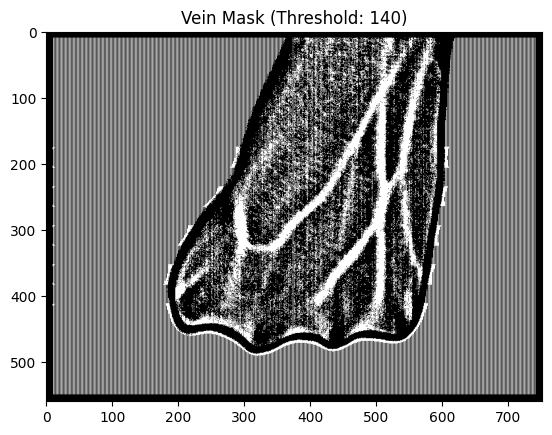

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the grayscale X-ray hand image
original_image = cv2.imread(r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-main\DorsalHandVeins_DB1_png\person_001_db1_L1.png", cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization for contrast enhancement
enhanced_image = cv2.equalizeHist(original_image)

# Define the margin to exclude from thresholding (adjust as needed)
margin = 10

# Determine the region of interest (ROI) excluding the margin
roi = enhanced_image[margin:-margin, margin:-margin]

# Set the block size for adaptive thresholding
block_size = 25

# Apply adaptive thresholding to create a binary mask
vein_mask = cv2.adaptiveThreshold(roi, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, block_size, 2)

# Create an empty mask of the same size as the original image
full_mask = np.zeros_like(original_image, dtype=np.uint8)

# Insert the vein mask into the ROI position of the full mask
full_mask[margin:-margin, margin:-margin] = vein_mask

# Apply a threshold to create a binary vein mask
_, vein_mask_thresholded = cv2.threshold(full_mask, 140, 255, cv2.THRESH_BINARY)

# Display the vein mask using Matplotlib
plt.imshow(vein_mask_thresholded, cmap='gray')
plt.title('Vein Mask (Threshold: 140)')
plt.show()


In [6]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the grayscale X-ray hand image
original_image = cv2.imread(r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-main\DorsalHandVeins_DB1_png\person_001_db1_L1.png", cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization for contrast enhancement
enhanced_image = cv2.equalizeHist(original_image)

# Define the margin to exclude from thresholding (adjust as needed)
margin = 10

# Determine the region of interest (ROI) excluding the margin
roi = enhanced_image[margin:-margin, margin:-margin]

# Set the block size for adaptive thresholding
block_size = 25

# Apply adaptive thresholding to create a binary mask
vein_mask = cv2.adaptiveThreshold(roi, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, block_size, 2)

# Create an empty mask of the same size as the original image
full_mask = np.zeros_like(enhanced_image, dtype=np.uint8)

# Insert the vein mask into the ROI position of the full mask
full_mask[margin:-margin, margin:-margin] = vein_mask

# Convert the vein mask to grayscale
vein_mask_gray = cv2.cvtColor(full_mask, cv2.COLOR_BGR2GRAY)

# Apply a threshold to create a binary vein mask
_, vein_mask_thresholded = cv2.threshold(vein_mask_gray, 140, 255, cv2.THRESH_BINARY)

# Convert the vein mask to grayscale
vein_mask_gray = cv2.cvtColor(vein_mask_thresholded, cv2.COLOR_BGR2GRAY)

# Apply Gaussian smoothing to the grayscale image
blurred_image = cv2.GaussianBlur(vein_mask_gray, (5, 5), 0)

# Apply binary thresholding
_, binary_thresh = cv2.threshold(blurred_image, 120, 255, cv2.THRESH_BINARY)

# Display the results
plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(vein_mask_thresholded, cmap='gray')
plt.title('Vein Mask (Threshold: 140)')

plt.subplot(2, 2, 3)
plt.imshow(binary_thresh, cmap='gray')
plt.title('Binary Threshold (Threshold: 120)')

plt.show()


error: OpenCV(4.9.0) d:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.simd_helpers.hpp:92: error: (-2:Unspecified error) in function '__cdecl cv::impl::`anonymous-namespace'::CvtHelper<struct cv::impl::`anonymous namespace'::Set<3,4,-1>,struct cv::impl::A0x59191d0d::Set<1,-1,-1>,struct cv::impl::A0x59191d0d::Set<0,2,5>,4>::CvtHelper(const class cv::_InputArray &,const class cv::_OutputArray &,int)'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 1


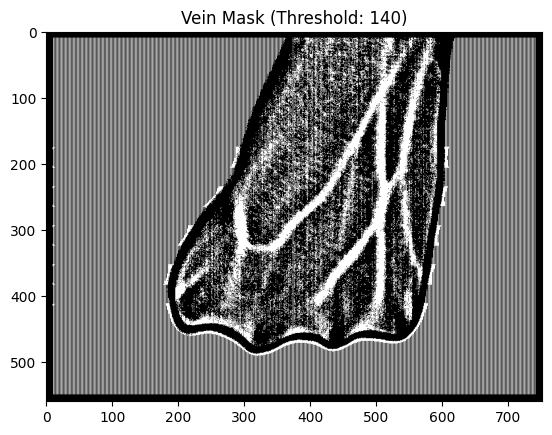

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png\person_001_db1_L1_gray.png


In [11]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the grayscale X-ray hand image
original_image = cv2.imread(r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-main\DorsalHandVeins_DB1_png\person_001_db1_L1.png", cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization for contrast enhancement
enhanced_image = cv2.equalizeHist(original_image)

# Define the margin to exclude from thresholding (adjust as needed)
margin = 10

# Determine the region of interest (ROI) excluding the margin
roi = enhanced_image[margin:-margin, margin:-margin]

# Set the block size for adaptive thresholding
block_size = 25

# Apply adaptive thresholding to create a binary mask
vein_mask = cv2.adaptiveThreshold(roi, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, block_size, 2)

# Create an empty mask of the same size as the original image
full_mask = np.zeros_like(original_image, dtype=np.uint8)

# Insert the vein mask into the ROI position of the full mask
full_mask[margin:-margin, margin:-margin] = vein_mask

# Apply a threshold to create a binary vein mask
_, vein_mask_thresholded = cv2.threshold(full_mask, 140, 255, cv2.THRESH_BINARY)

# Display the vein mask using Matplotlib
plt.imshow(vein_mask_thresholded, cmap='gray')
plt.title('Vein Mask (Threshold: 140)')
plt.show()

# Define the file path for saving the grayscale vein mask image
save_path = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png\person_001_db1_L1_gray.png"

# Save the vein mask image
cv2.imwrite(save_path, vein_mask_thresholded)

print(f"Image saved as: {save_path}")


Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_001_db1_L1_binary.png


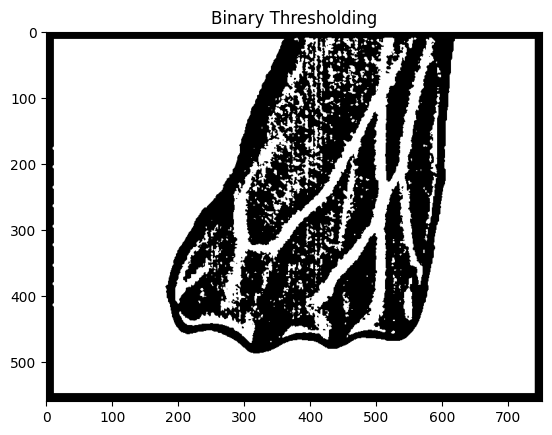

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the original color image
color_image = cv2.imread(r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png\person_001_db1_L1_gray.png")

# Convert color image to grayscale
gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian smoothing
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Thresholding methods
_, binary_thresh = cv2.threshold(blurred_image, 120, 255, cv2.THRESH_BINARY)

# Define the file path for saving the grayscale vein mask image
save_path = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_001_db1_L1_binary.png"

# Save the vein mask image
cv2.imwrite(save_path, binary_thresh)

print(f"Image saved as: {save_path}")
# Visualize the binary thresholding image
plt.imshow(binary_thresh, cmap='gray')
plt.title('Binary Thresholding')
plt.show()


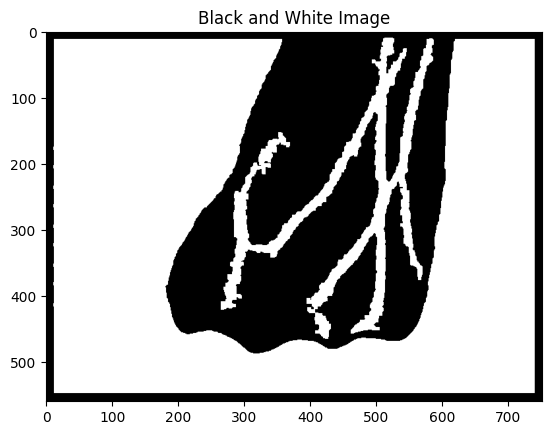

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_L1_bw.png


In [30]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the original color image
color_image = cv2.imread(r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_001_db1_L1_binary.png")

# Convert color image to grayscale
gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian smoothing
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Thresholding methods
_, binary_thresh = cv2.threshold(blurred_image, 120, 255, cv2.THRESH_BINARY)

# Morphological operations to remove noise
kernel = np.ones((5, 5), np.uint8)
cleaned_binary_thresh = cv2.morphologyEx(binary_thresh, cv2.MORPH_OPEN, kernel)

# Find contours to identify connected components
contours, _ = cv2.findContours(cleaned_binary_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter out small contours (noise) and create a mask for the veins
vein_mask = np.zeros_like(cleaned_binary_thresh)
for contour in contours:
    area = cv2.contourArea(contour)
    if area > 1500:  # Adjust this threshold based on the size of the veins
        cv2.drawContours(vein_mask, [contour], -1, 255, -1)

# Create a red mask for filling
red_mask = np.zeros_like(color_image)
red_mask[:] = (0, 0, 255)  # Set red color

# Fill white areas (veins) with red
filled_image = np.where(vein_mask[..., None], red_mask, color_image)

# Convert to HSV color space
hsv_image = cv2.cvtColor(filled_image, cv2.COLOR_BGR2HSV)

# Define lower and upper bounds for red color in HSV
lower_red = np.array([0, 100, 100])
upper_red = np.array([10, 255, 255])

# Create a mask for red color
red_mask = cv2.inRange(hsv_image, lower_red, upper_red)

# Apply bitwise AND operation to retain only red areas
red_only = cv2.bitwise_and(filled_image, filled_image, mask=red_mask)

# Convert red areas to white and the rest to black
red_only[np.where((red_only == [0, 0, 255]).all(axis=2))] = [255, 255, 255]
red_only[np.where((red_only != [255, 255, 255]).any(axis=2))] = [0, 0, 0]

# Convert to grayscale
final_image = cv2.cvtColor(red_only, cv2.COLOR_BGR2GRAY)

# Visualize the result
plt.imshow(final_image, cmap='gray')
plt.title('Black and White Image')
plt.show()







save_path = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_L1_bw.png"

# Save the vein mask image
cv2.imwrite(save_path, final_image)

print(f"Image saved as: {save_path}")


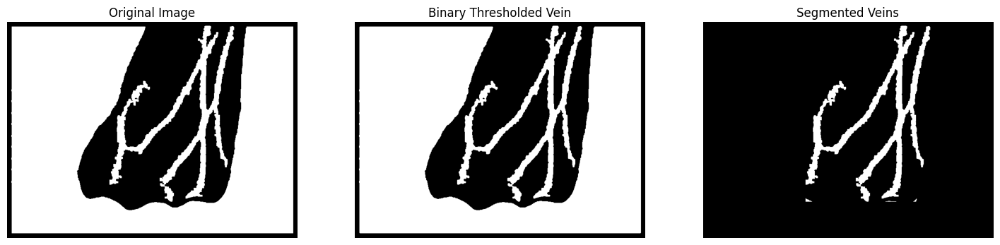

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(image):
    # Apply Gaussian blur to reduce noise and enhance edges
    img_blur = cv2.GaussianBlur(image, (5, 5), 0)
    return img_blur

def segment_veins(image):
    # Preprocess the image
    img = preprocess_image(image)
    
    # Apply thresholding to segment the veins
    _, thresholded = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Find contours in the binary image
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Get the bounding boxes for all contours
    bounding_boxes = [cv2.boundingRect(contour) for contour in contours]
    
    # Find the smallest bounding box
    min_x, min_y, min_w, min_h = min(bounding_boxes, key=lambda box: box[2] * box[3])
    
    # Create a blank black image
    black_image = np.zeros_like(image)
    
    # Fill the region inside the smallest bounding box with the original pixel values
    black_image[min_y:min_y + min_h, min_x:min_x + min_w] = image[min_y:min_y + min_h, min_x:min_x + min_w]
    
    # Create a triangular mask
    triangle_mask = np.ones_like(black_image) * 255
    triangle_vertices_top_left = np.array([[min_x, min_y], [min_x, min_y + 250], [min_x + 130, min_y]], dtype=np.int32)
    triangle_vertices_bottom_right = np.array([[min_x + min_w - 37, min_y + min_h], [min_x + min_w, min_y + min_h], [min_x + min_w, min_y + min_h - 140]], dtype=np.int32)
    
    # Draw the filled triangles
    cv2.drawContours(black_image, [triangle_vertices_top_left, triangle_vertices_bottom_right], -1, (0, 0, 0), thickness=cv2.FILLED)
    
    return thresholded, black_image

# Example usage
image_path = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_L1_bw.png"
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
binary_thresholded, segmented_image = segment_veins(original_image)

# Display the images
plt.figure(figsize=(18, 6))

plt.subplot(131)
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(binary_thresholded, cmap='gray')
plt.title('Binary Thresholded Vein')
plt.axis('off')

plt.subplot(133)
plt.imshow(segmented_image, cmap='gray')
plt.title('Segmented Veins')
plt.axis('off')

plt.show()


In [7]:
import os

# Directory containing the grayscale X-ray hand images
image_dir = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-main\DorsalHandVeins_DB1_png"

# Directory to save the processed images
save_dir = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png"

# List all image files in the directory
image_files = os.listdir(image_dir)

# Limit to the first 10 images
image_files = image_files[:60]

# Process each image
for image_file in image_files:
    # Load the grayscale X-ray hand image
    original_image = cv2.imread(os.path.join(image_dir, image_file), cv2.IMREAD_GRAYSCALE)

    # Apply histogram equalization for contrast enhancement
    enhanced_image = cv2.equalizeHist(original_image)

    # Define the margin to exclude from thresholding (adjust as needed)
    margin = 10

    # Determine the region of interest (ROI) excluding the margin
    roi = enhanced_image[margin:-margin, margin:-margin]

    # Set the block size for adaptive thresholding
    block_size = 25

    # Apply adaptive thresholding to create a binary mask
    vein_mask = cv2.adaptiveThreshold(roi, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, block_size, 2)

    # Create an empty mask of the same size as the original image
    full_mask = np.zeros_like(original_image, dtype=np.uint8)

    # Insert the vein mask into the ROI position of the full mask
    full_mask[margin:-margin, margin:-margin] = vein_mask

    # Apply a threshold to create a binary vein mask
    _, vein_mask_thresholded = cv2.threshold(full_mask, 140, 255, cv2.THRESH_BINARY)

    # Define the file path for saving the grayscale vein mask image
    save_path = os.path.join(save_dir, f"{os.path.splitext(image_file)[0]}_gray.png")

    # Save the vein mask image
    cv2.imwrite(save_path, vein_mask_thresholded)

    print(f"Image saved as: {save_path}")


Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png\person_001_db1_L1_gray.png
Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png\person_001_db1_L2_gray.png
Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png\person_001_db1_L3_gray.png
Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png\person_001_db1_L4_gray.png
Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png\person_001_db1_R1_gray.png
Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png\person_001_db1_R2_gray.png
Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png\person_001_db1_R3_gray.png
Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png\person_001_db1_R4_gray.png
Image saved as: C:\Downl

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_001_db1_L1_gray.png


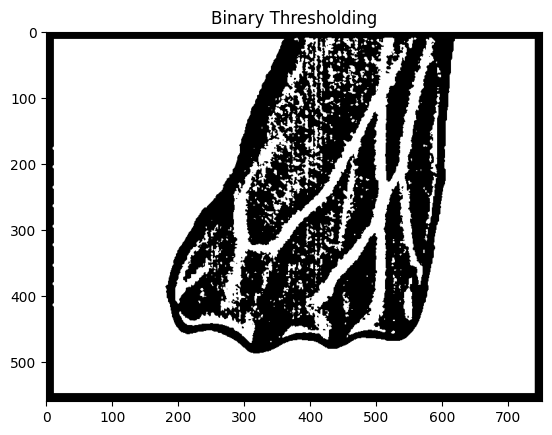

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_001_db1_L2_gray.png


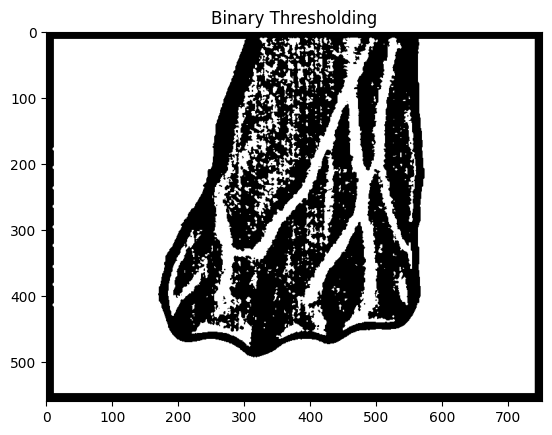

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_001_db1_L3_gray.png


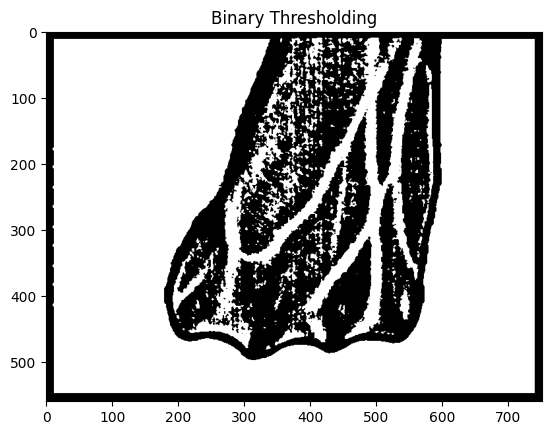

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_001_db1_L4_gray.png


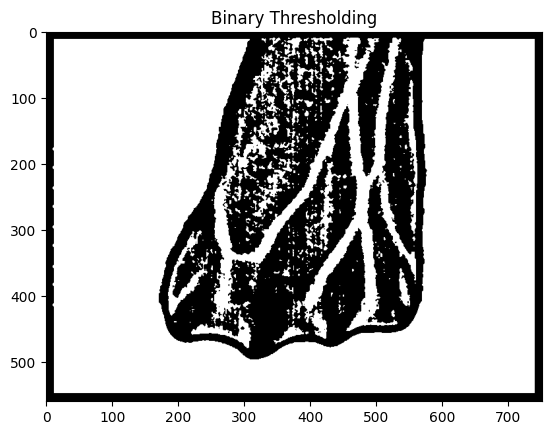

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_001_db1_R1_gray.png


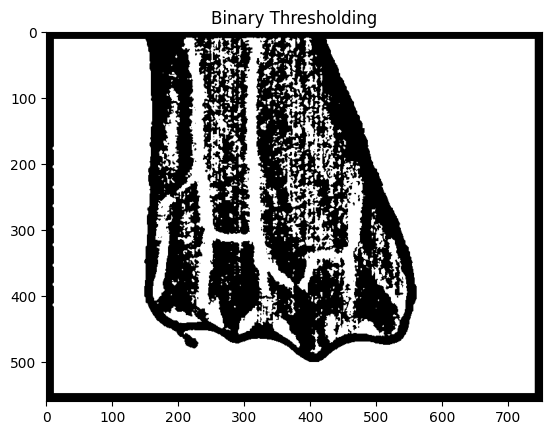

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_001_db1_R2_gray.png


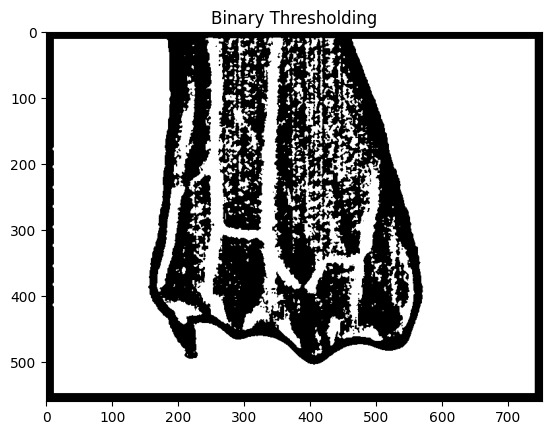

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_001_db1_R3_gray.png


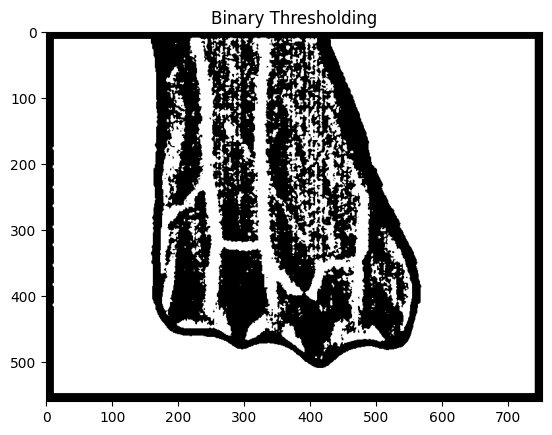

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_001_db1_R4_gray.png


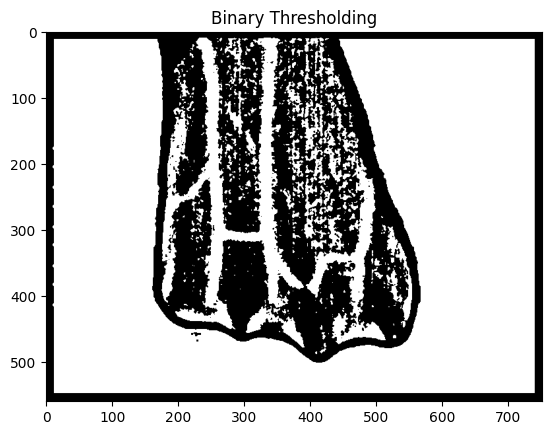

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_002_db1_L1_gray.png


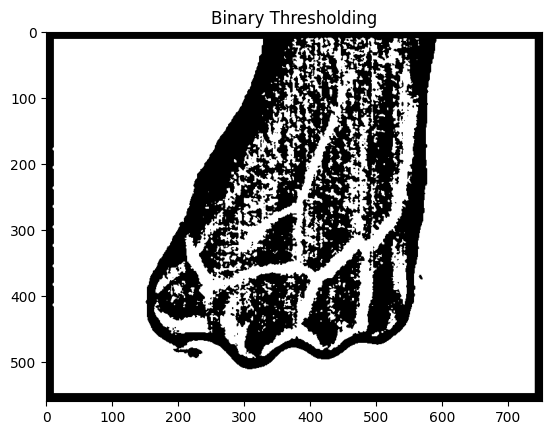

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_002_db1_L2_gray.png


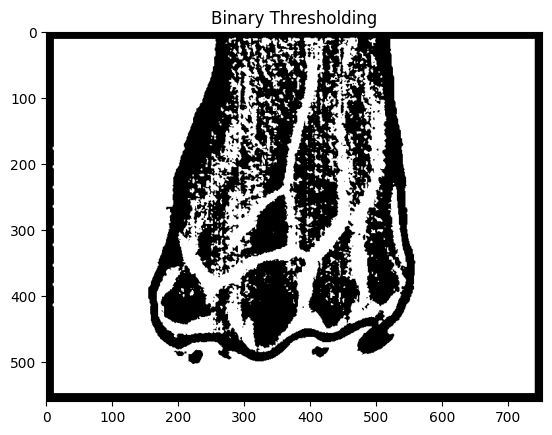

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_002_db1_L3_gray.png


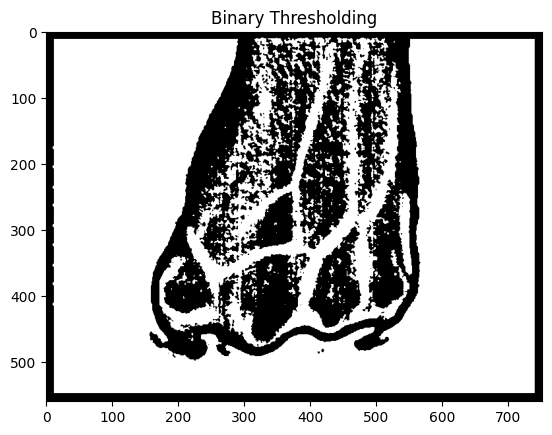

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_002_db1_L4_gray.png


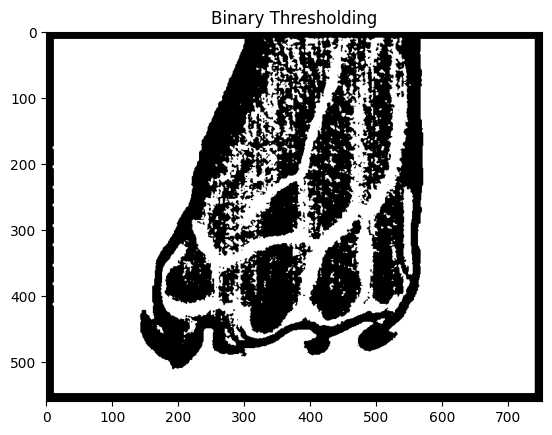

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_002_db1_R1_gray.png


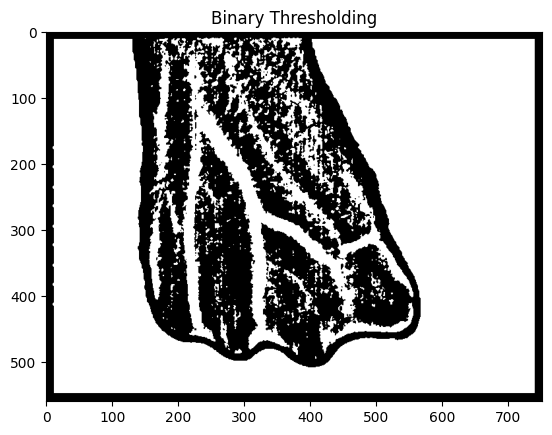

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_002_db1_R2_gray.png


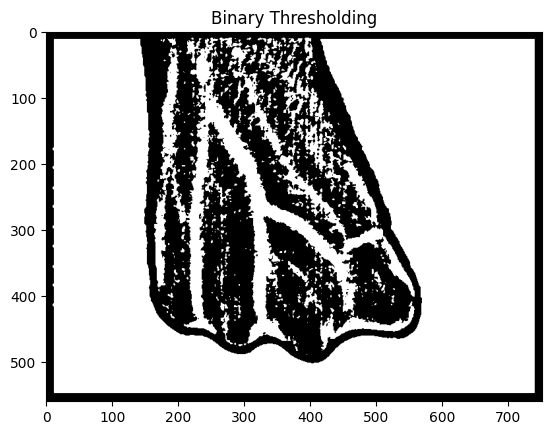

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_002_db1_R3_gray.png


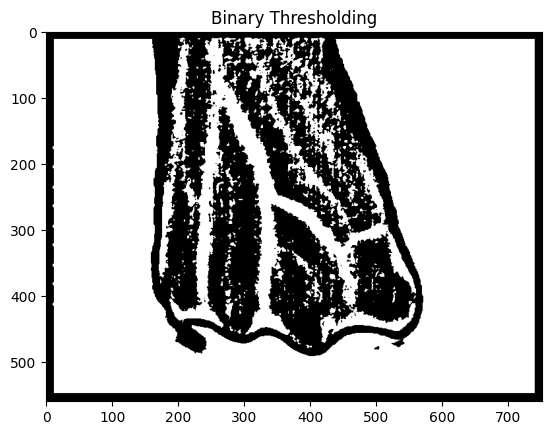

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_002_db1_R4_gray.png


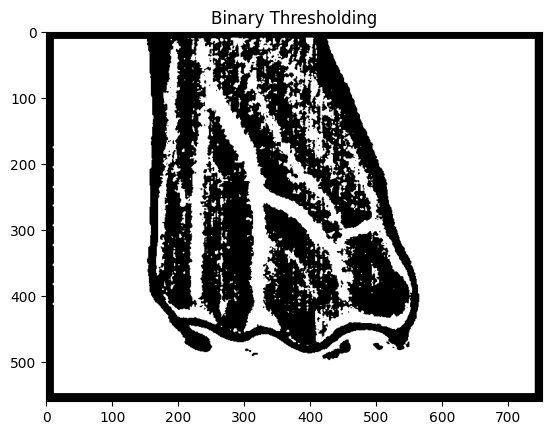

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_003_db1_L1_gray.png


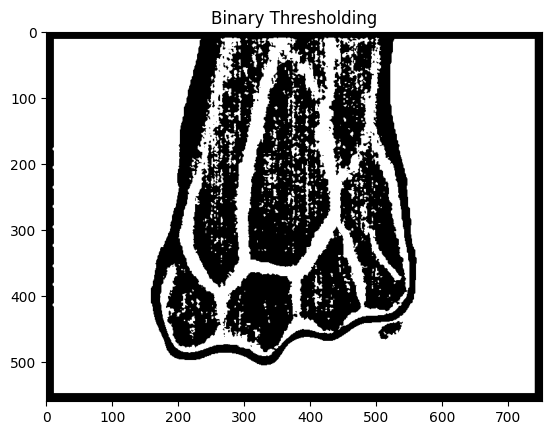

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_003_db1_L2_gray.png


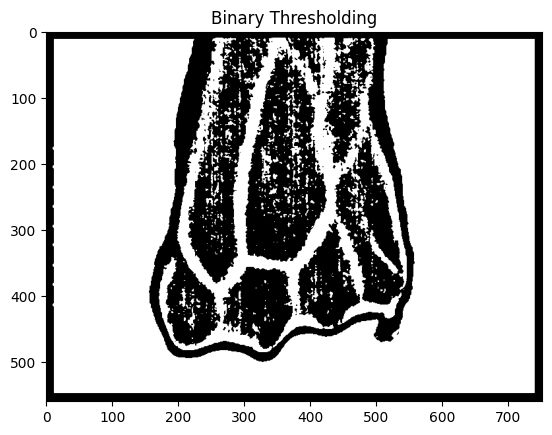

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_003_db1_L3_gray.png


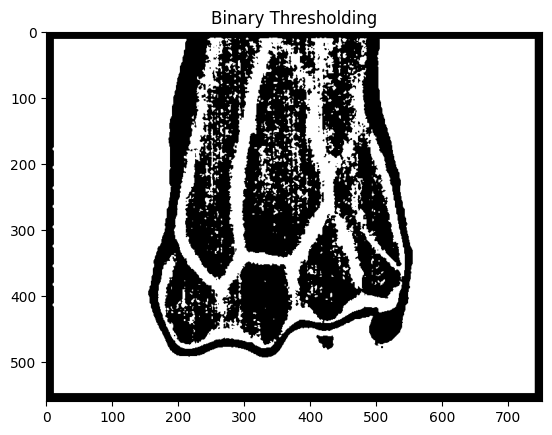

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_003_db1_L4_gray.png


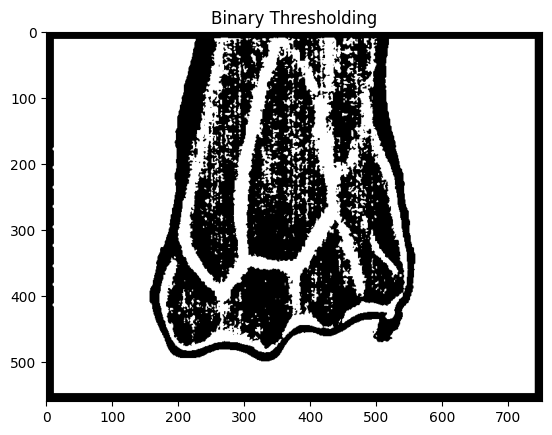

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_003_db1_R1_gray.png


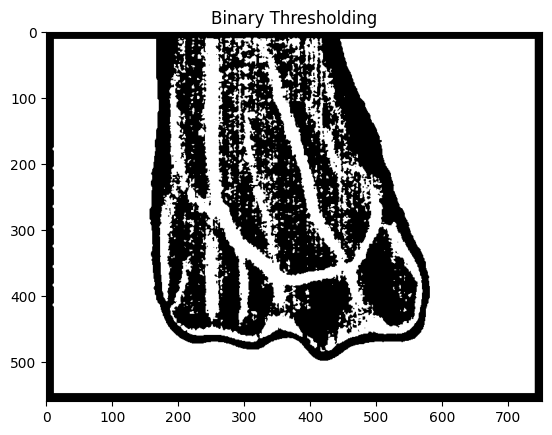

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_003_db1_R2_gray.png


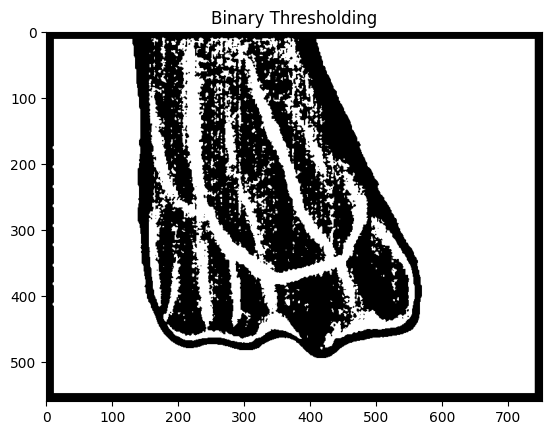

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_003_db1_R3_gray.png


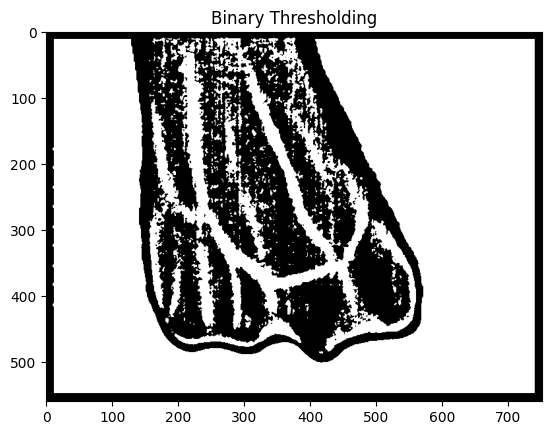

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_003_db1_R4_gray.png


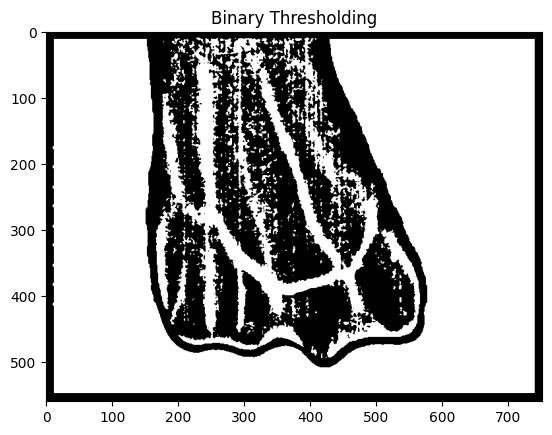

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_004_db1_L1_gray.png


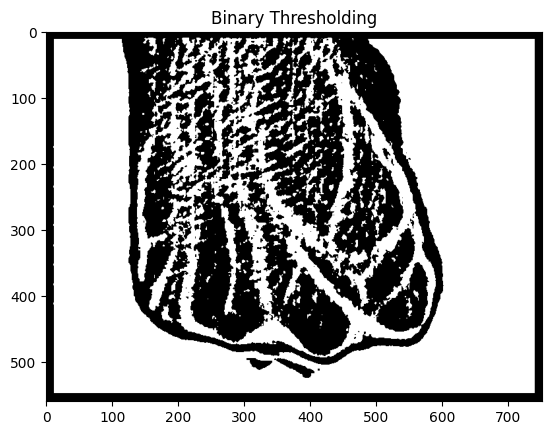

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_004_db1_L2_gray.png


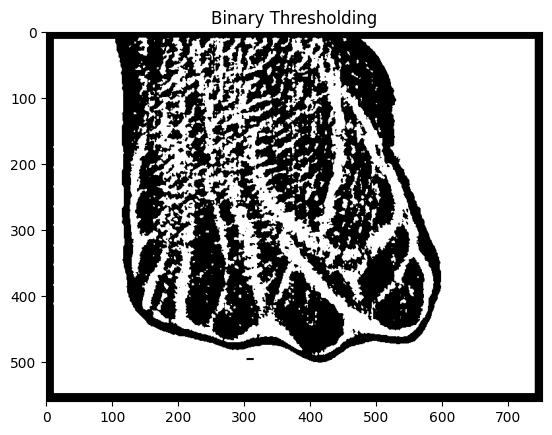

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_004_db1_L3_gray.png


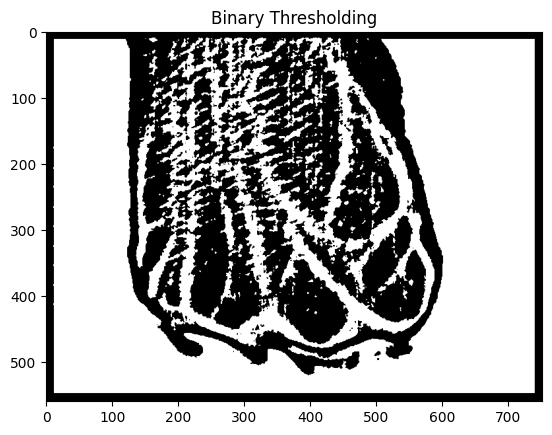

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_004_db1_L4_gray.png


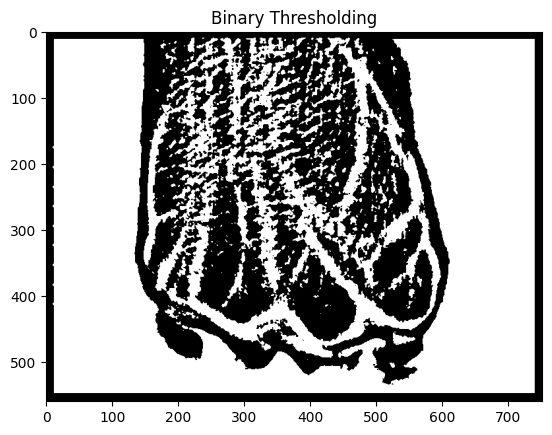

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_004_db1_R1_gray.png


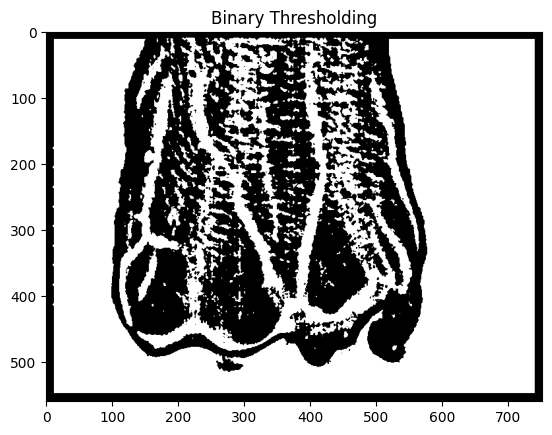

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_004_db1_R2_gray.png


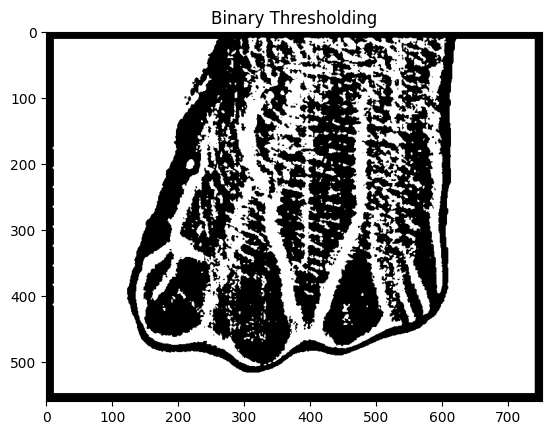

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_004_db1_R3_gray.png


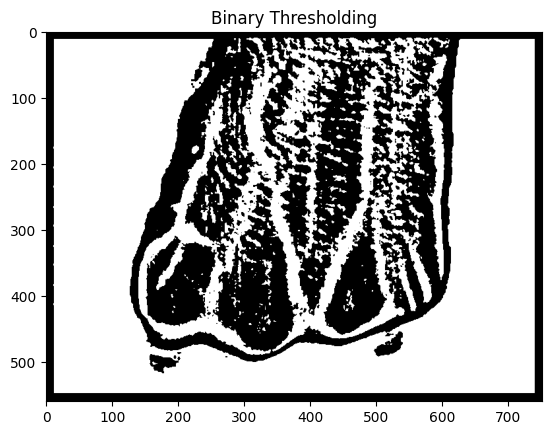

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_004_db1_R4_gray.png


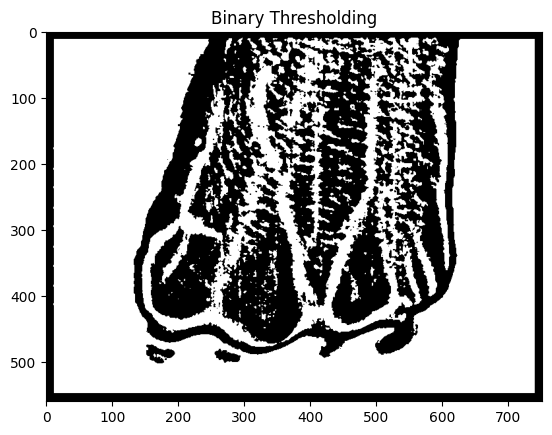

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_005_db1_L1_gray.png


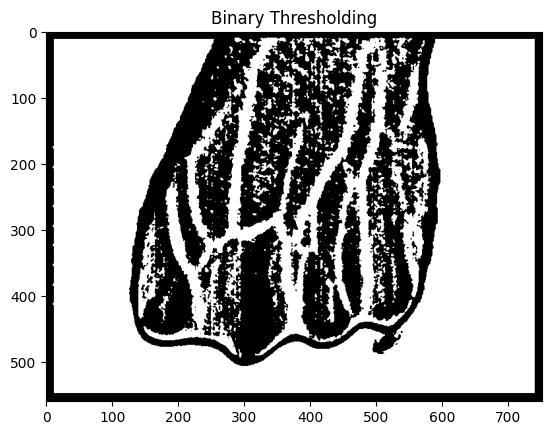

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_005_db1_L2_gray.png


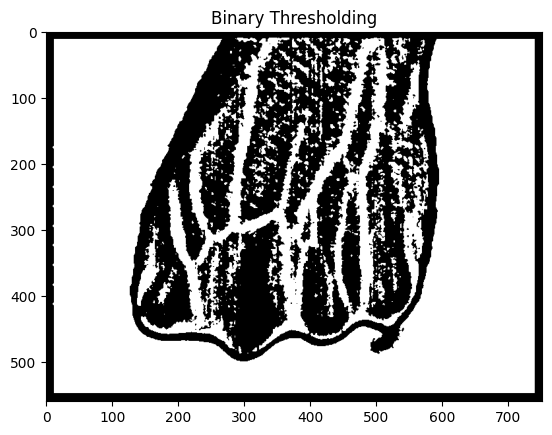

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_005_db1_L3_gray.png


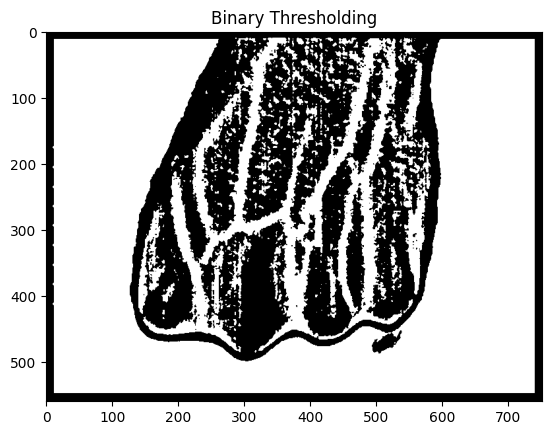

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_005_db1_L4_gray.png


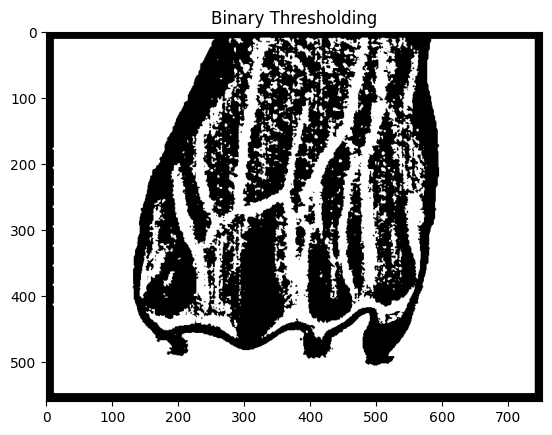

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_005_db1_R1_gray.png


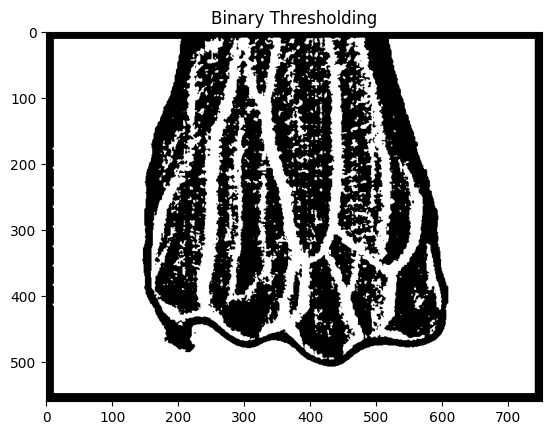

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_005_db1_R2_gray.png


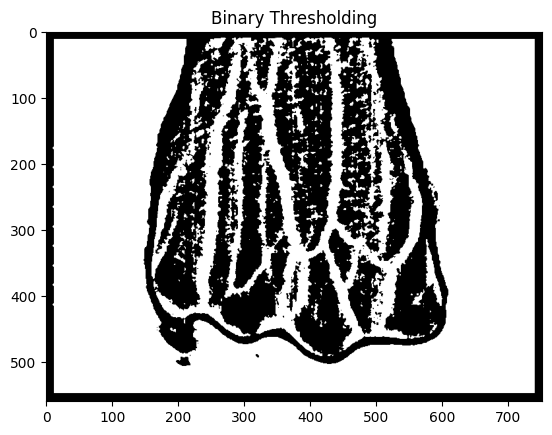

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_005_db1_R3_gray.png


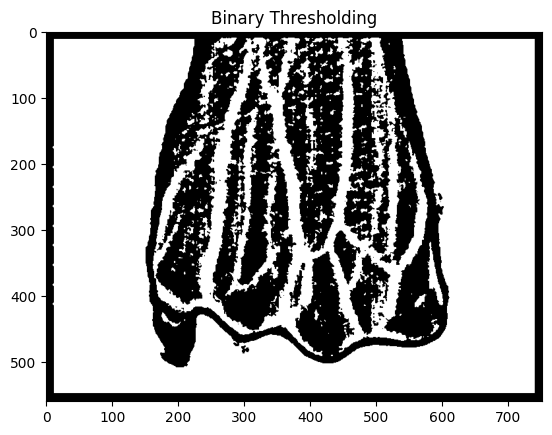

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_005_db1_R4_gray.png


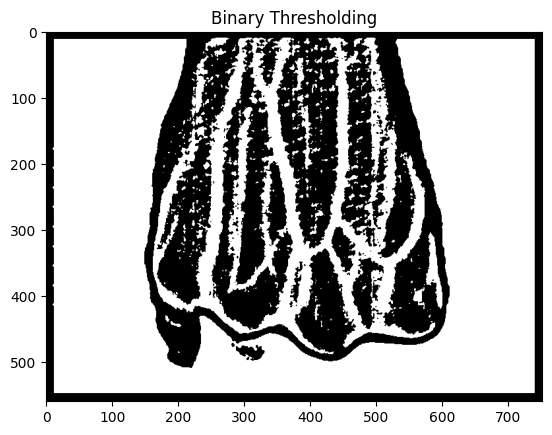

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_006_db1_L1_gray.png


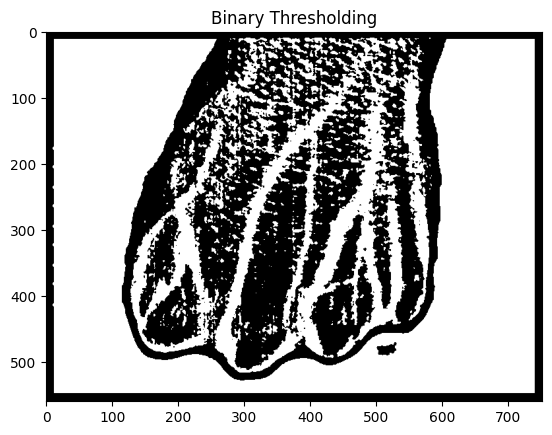

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_006_db1_L2_gray.png


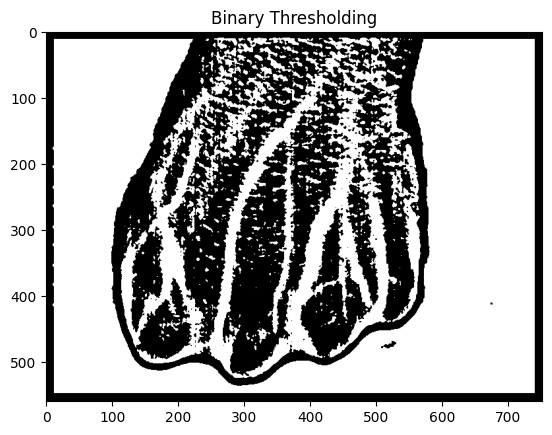

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_006_db1_L3_gray.png


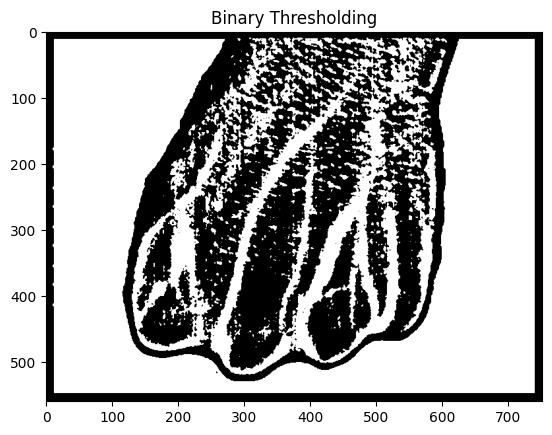

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_006_db1_L4_gray.png


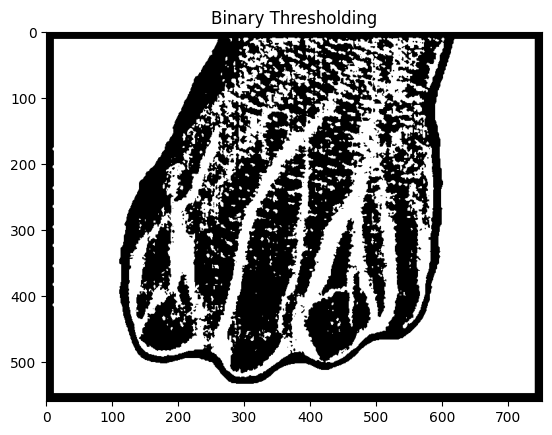

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_006_db1_R1_gray.png


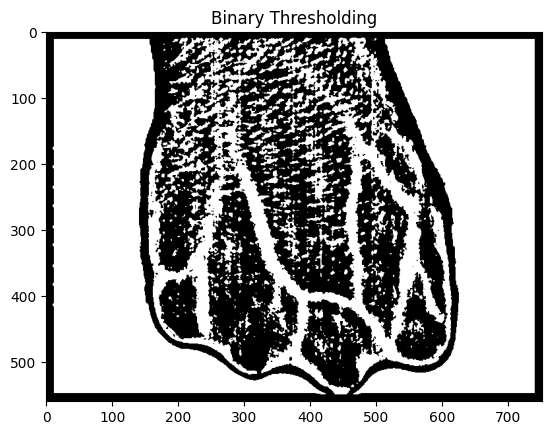

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_006_db1_R2_gray.png


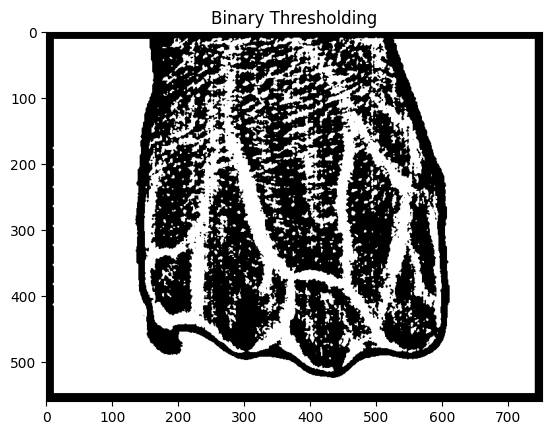

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_006_db1_R3_gray.png


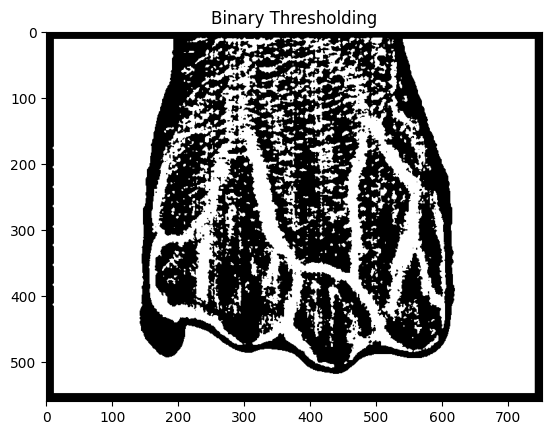

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_006_db1_R4_gray.png


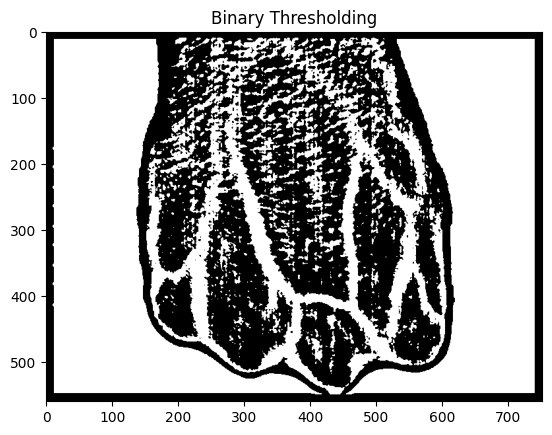

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_007_db1_L1_gray.png


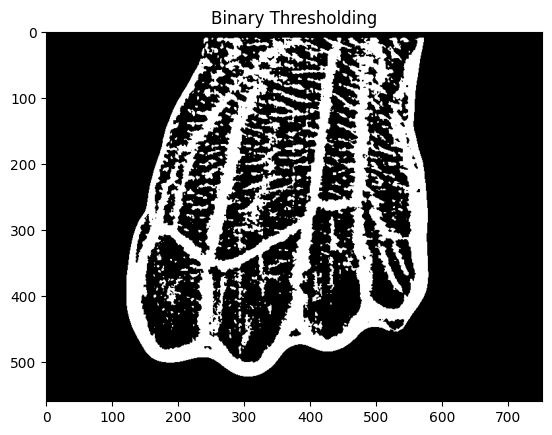

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_007_db1_L2_gray.png


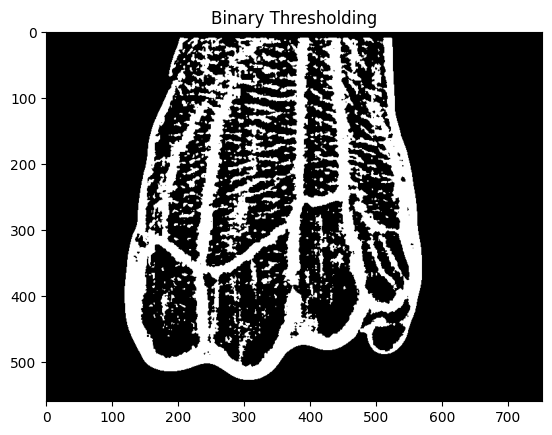

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_007_db1_L3_gray.png


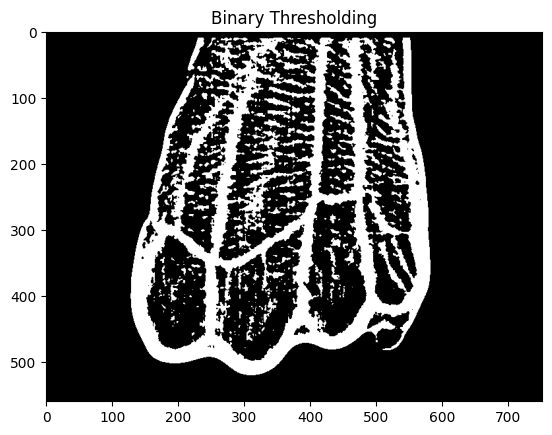

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_007_db1_L4_gray.png


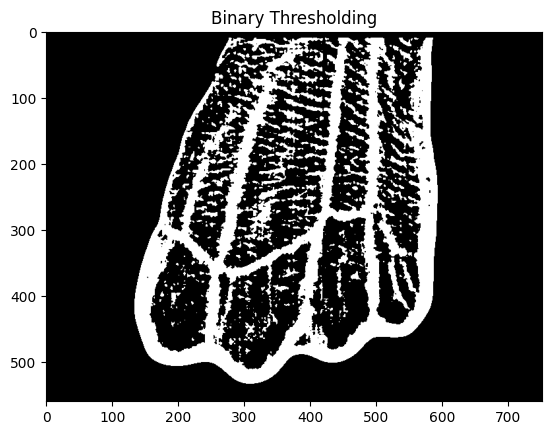

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_007_db1_R1_gray.png


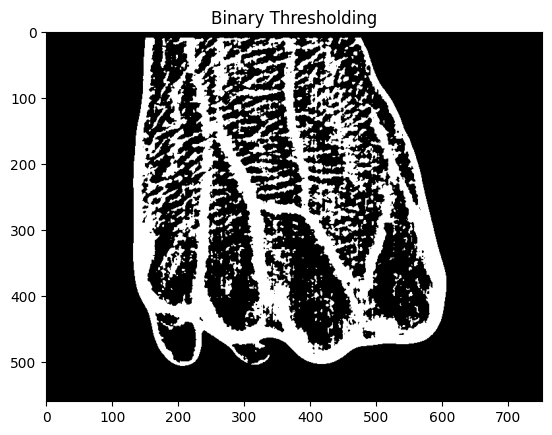

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_007_db1_R2_gray.png


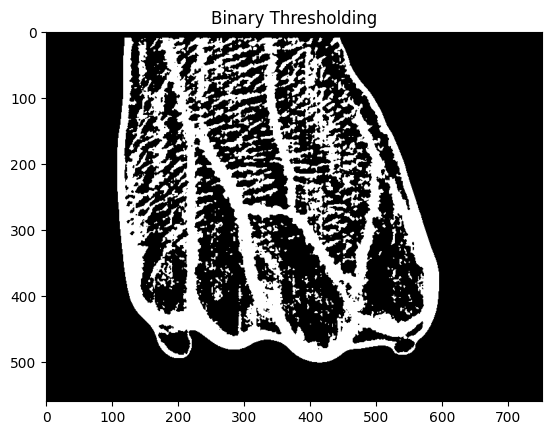

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_007_db1_R3_gray.png


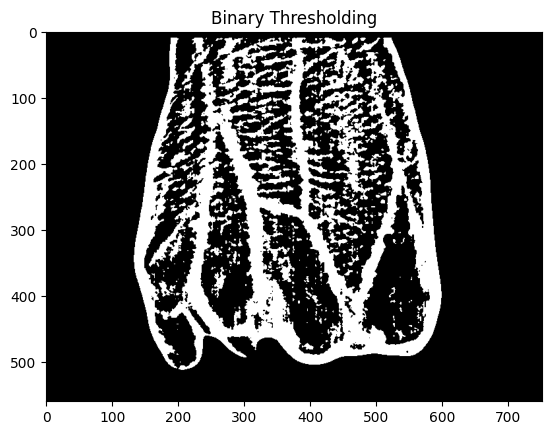

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_007_db1_R4_gray.png


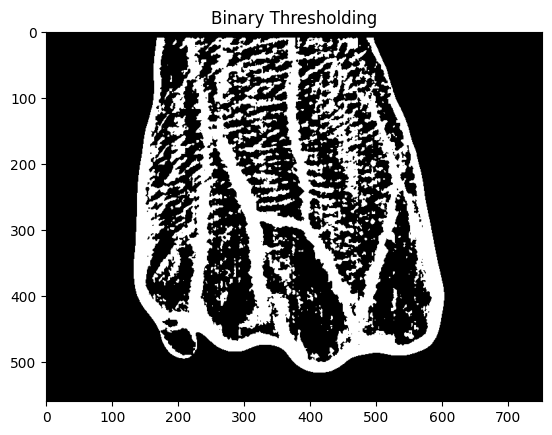

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_008_db1_L1_gray.png


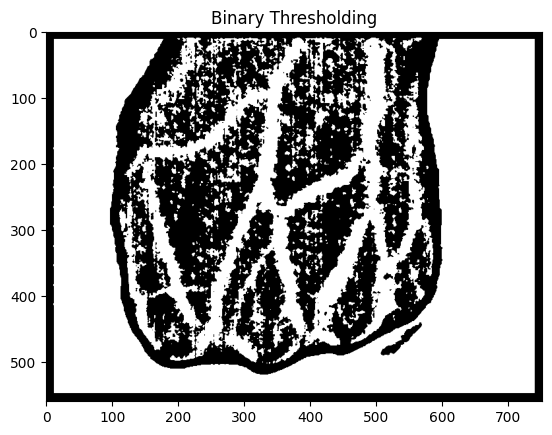

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_008_db1_L2_gray.png


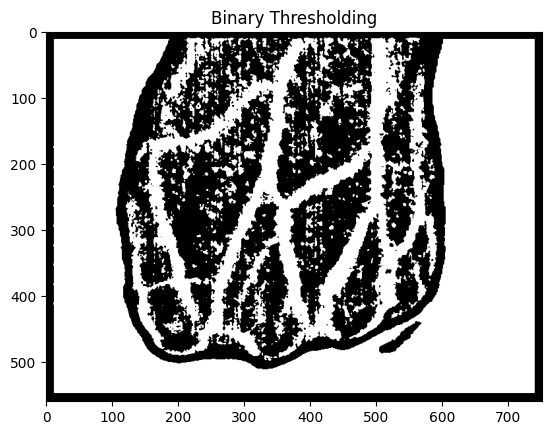

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_008_db1_L3_gray.png


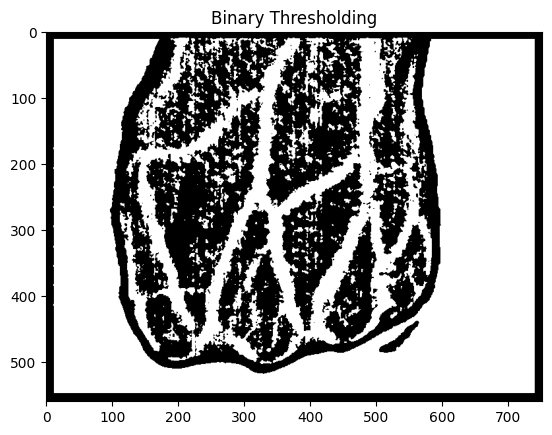

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png\person_008_db1_L4_gray.png


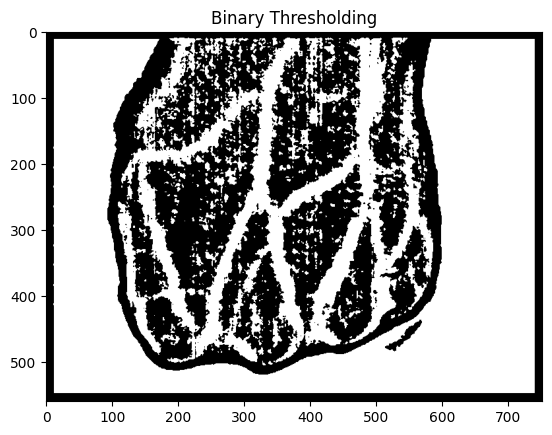

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define the directory containing the images
image_directory = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-gray\DorsalHandVeins_DB1_png"

# Define the directory to save the processed images
save_directory = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png"

# List all the image files in the directory
image_files = os.listdir(image_directory)

# Sort the image files
image_files.sort()

# Process the first 10 images
for image_file in image_files[:60]:
    # Construct the full path to the image
    image_path = os.path.join(image_directory, image_file)
    
    # Read the original grayscale vein mask image
    gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply Gaussian smoothing
    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

    # Thresholding methods
    _, binary_thresh = cv2.threshold(blurred_image, 120, 255, cv2.THRESH_BINARY)

    # Construct the full path to save the processed image
    save_path = os.path.join(save_directory, image_file)

    # Save the binary thresholding image
    cv2.imwrite(save_path, binary_thresh)

    print(f"Image saved as: {save_path}")

    # Visualize the binary thresholding image
    plt.imshow(binary_thresh, cmap='gray')
    plt.title('Binary Thresholding')
    plt.show()


Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_L1_binary.png


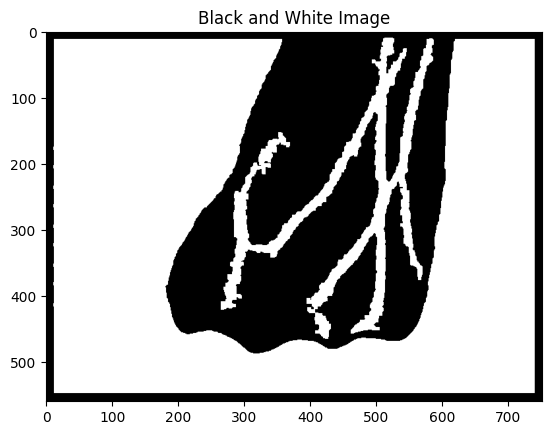

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_L1_gray.png


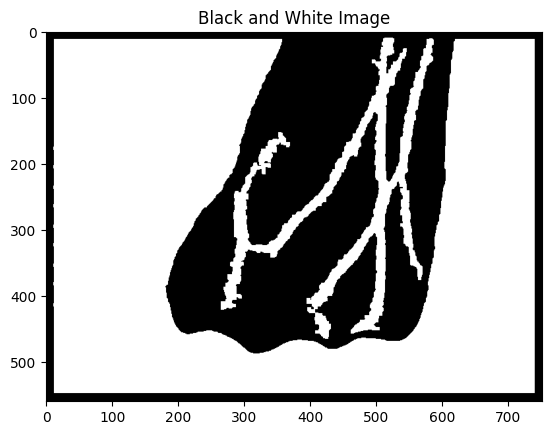

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_L2_gray.png


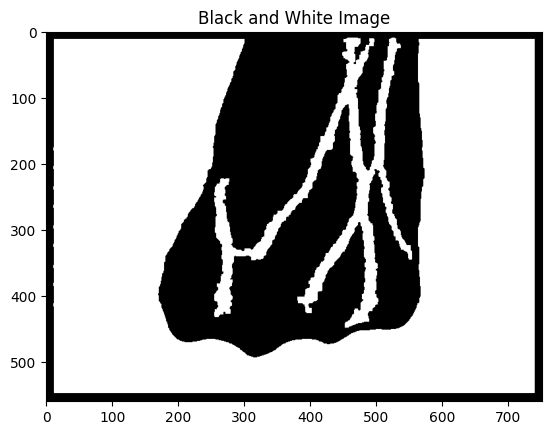

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_L3_gray.png


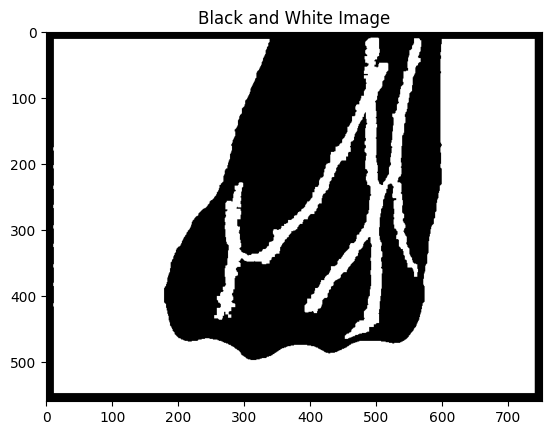

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_L4_gray.png


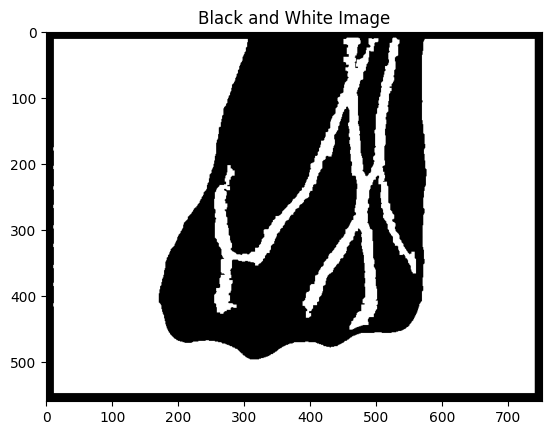

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_R1_gray.png


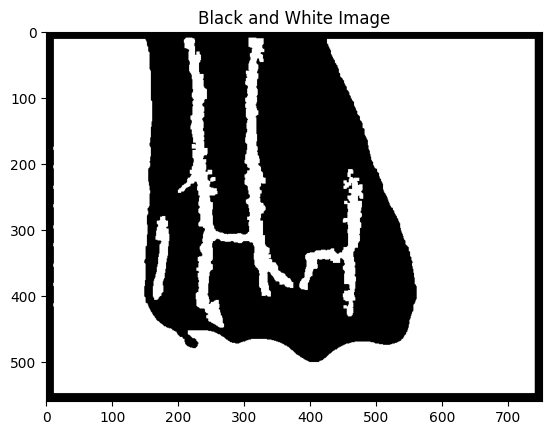

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_R2_gray.png


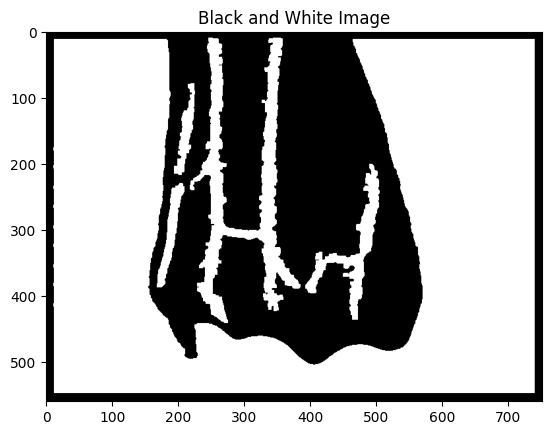

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_R3_gray.png


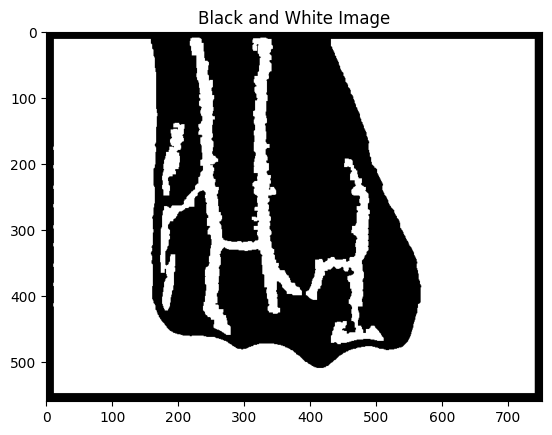

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_001_db1_R4_gray.png


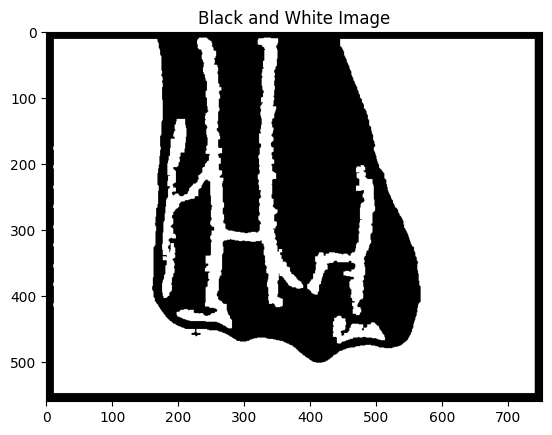

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_002_db1_L1_gray.png


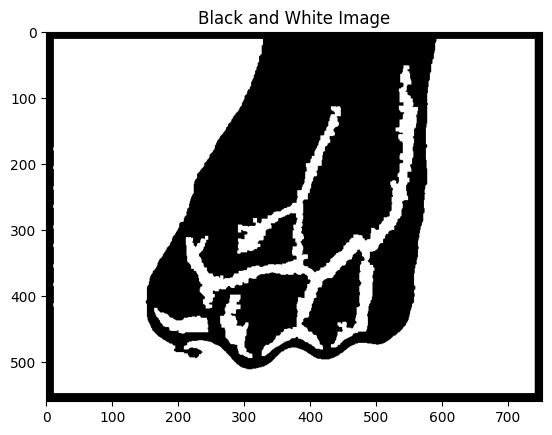

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_002_db1_L2_gray.png


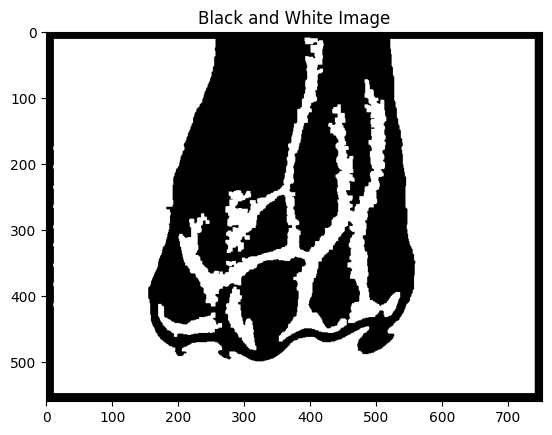

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_002_db1_L3_gray.png


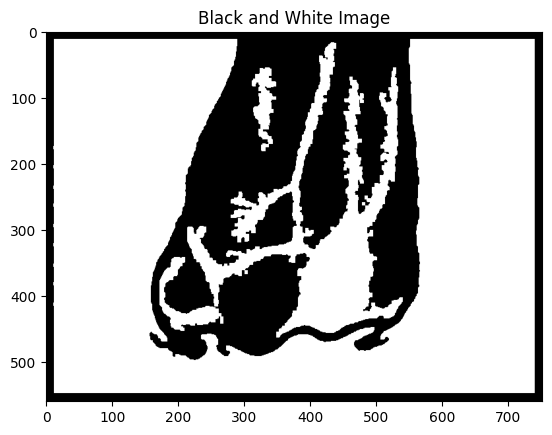

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_002_db1_L4_gray.png


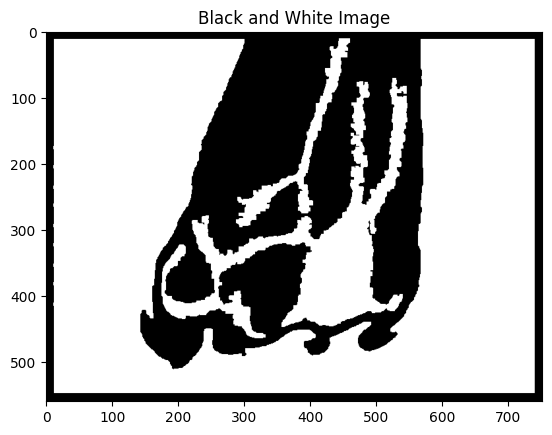

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_002_db1_R1_gray.png


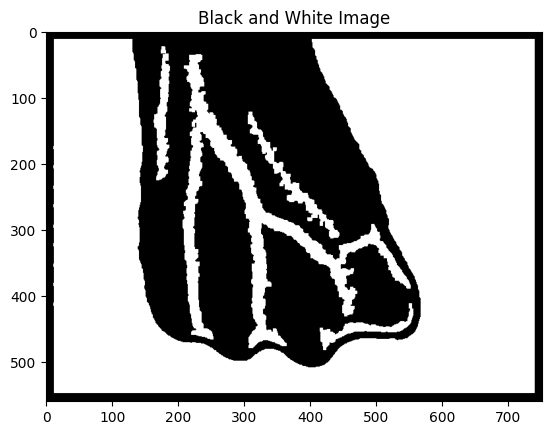

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_002_db1_R2_gray.png


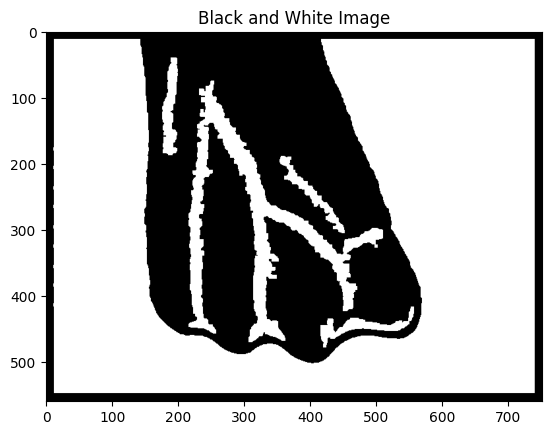

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_002_db1_R3_gray.png


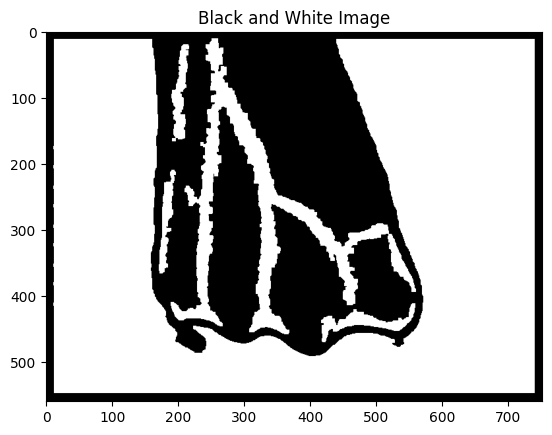

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_002_db1_R4_gray.png


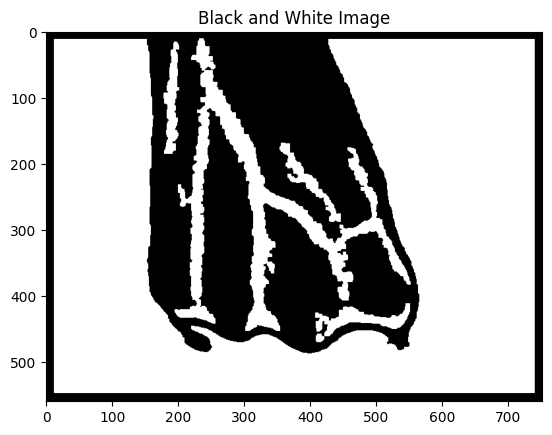

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_003_db1_L1_gray.png


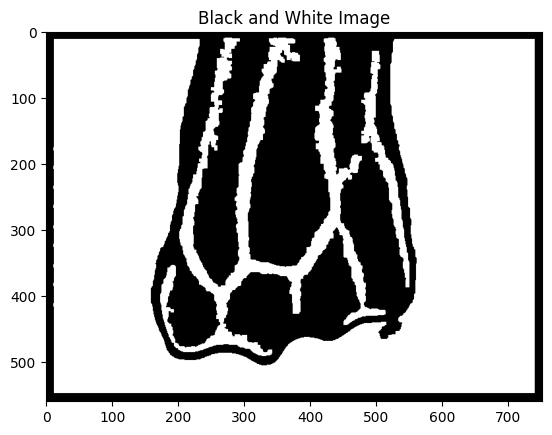

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_003_db1_L2_gray.png


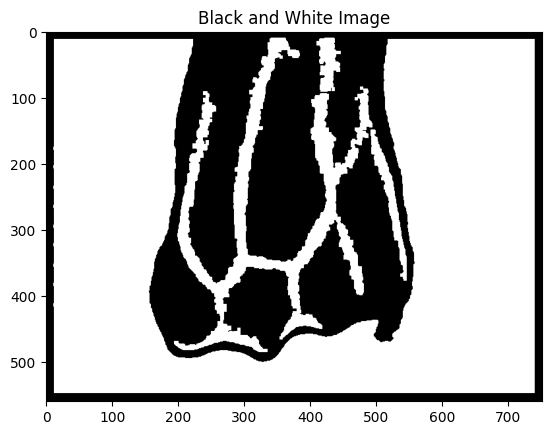

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_003_db1_L3_gray.png


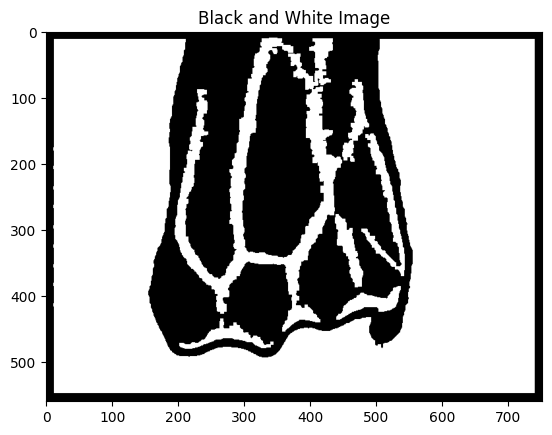

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_003_db1_L4_gray.png


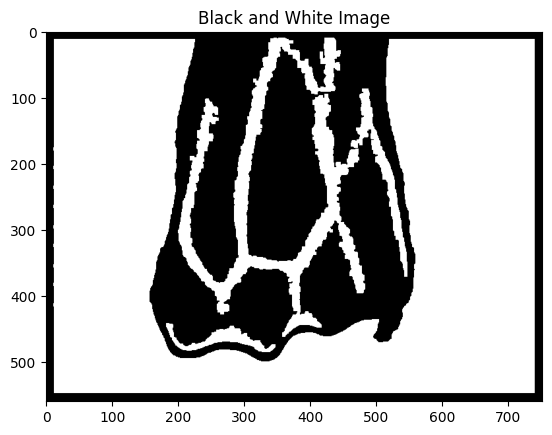

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_003_db1_R1_gray.png


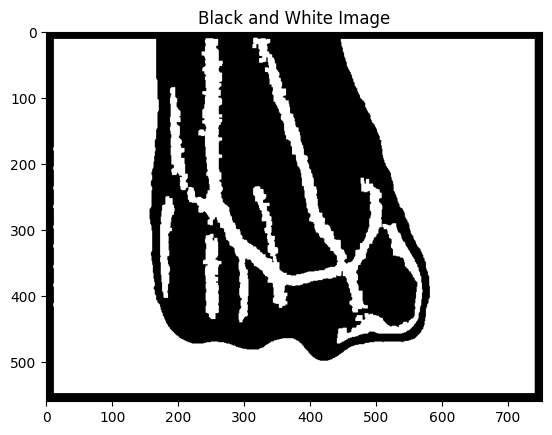

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_003_db1_R2_gray.png


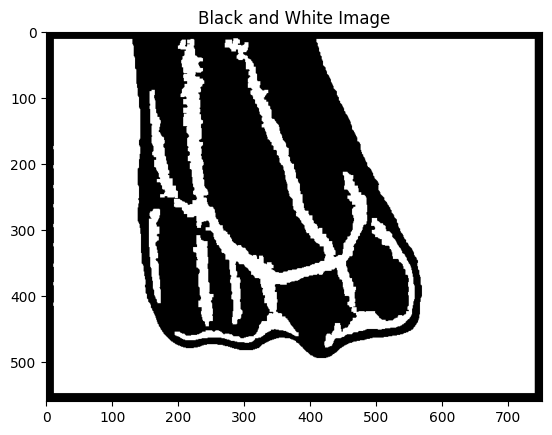

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_003_db1_R3_gray.png


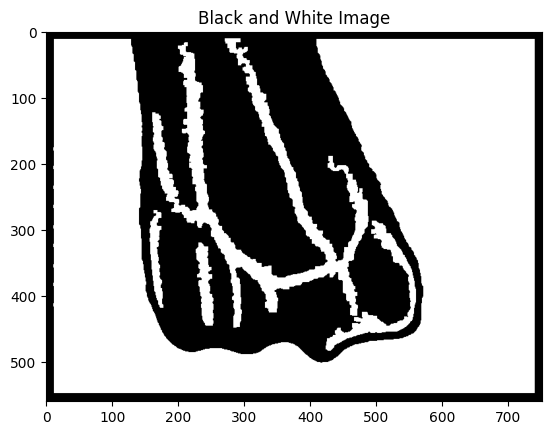

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_003_db1_R4_gray.png


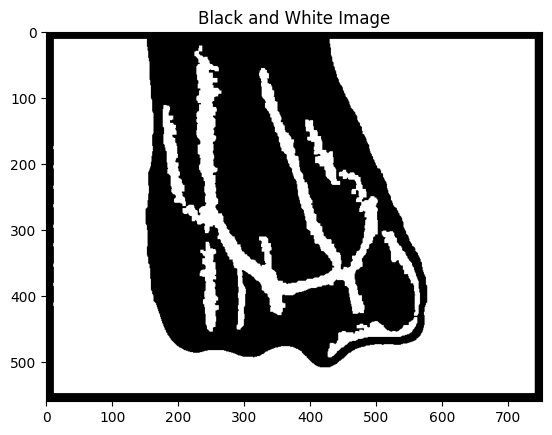

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_004_db1_L1_gray.png


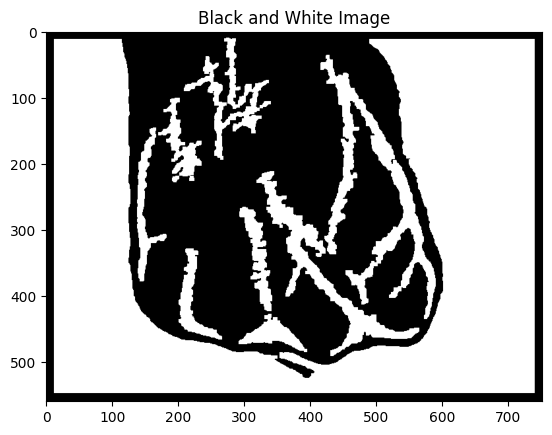

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_004_db1_L2_gray.png


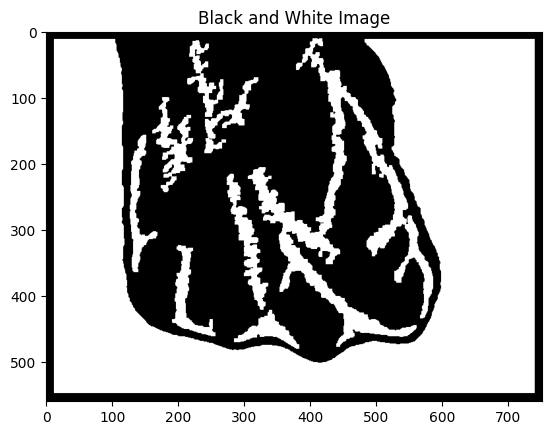

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_004_db1_L3_gray.png


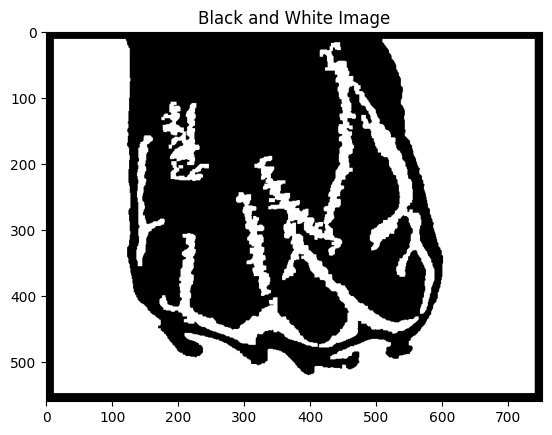

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_004_db1_L4_gray.png


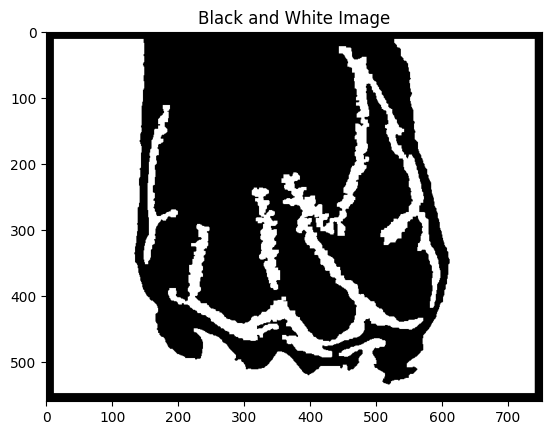

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_004_db1_R1_gray.png


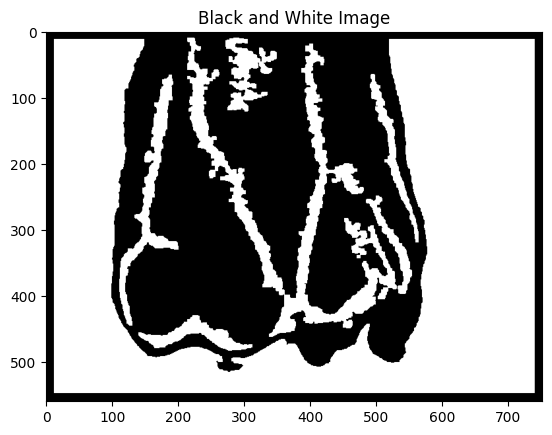

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_004_db1_R2_gray.png


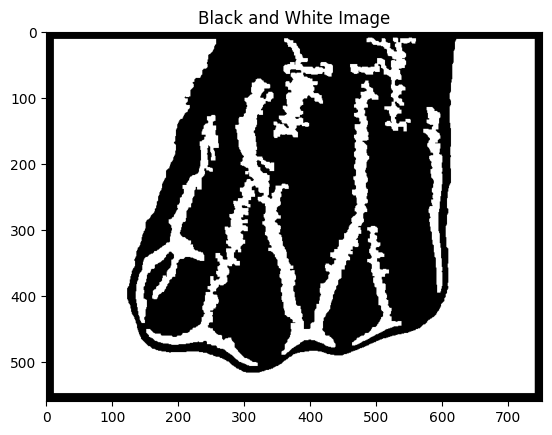

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_004_db1_R3_gray.png


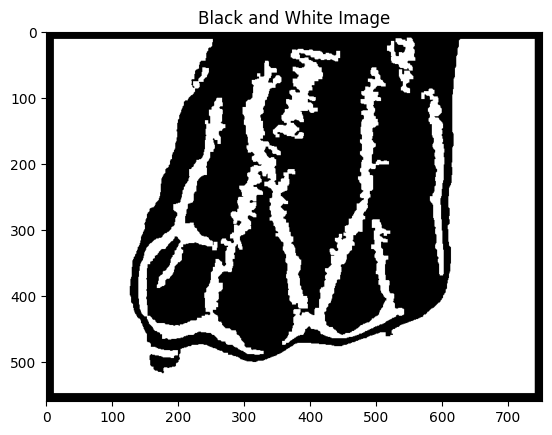

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_004_db1_R4_gray.png


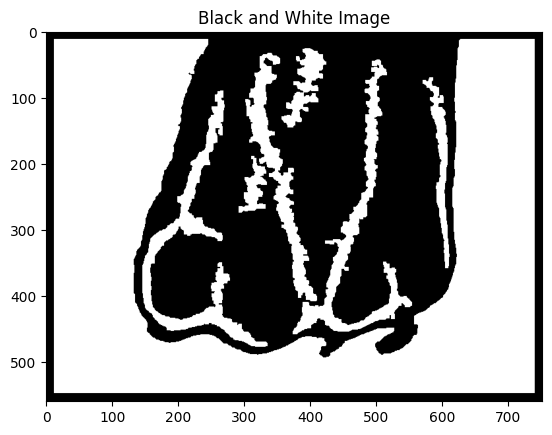

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_005_db1_L1_gray.png


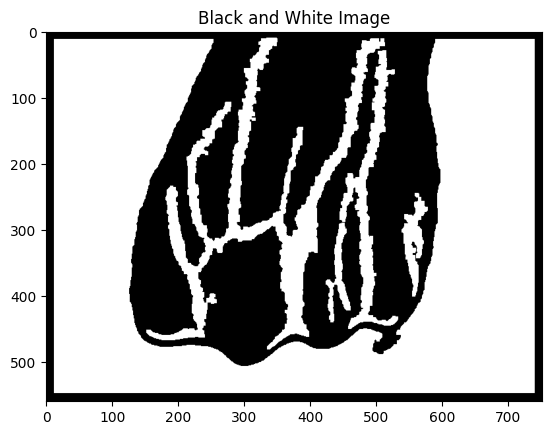

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_005_db1_L2_gray.png


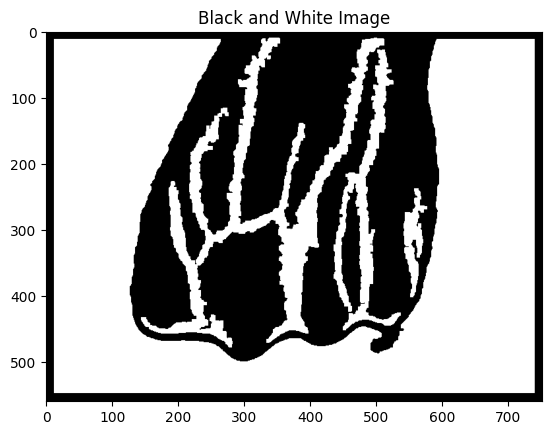

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_005_db1_L3_gray.png


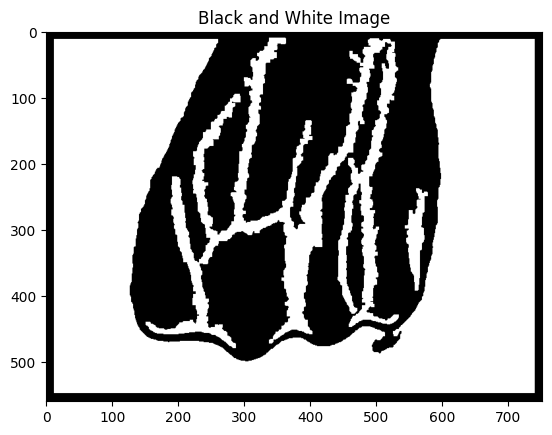

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_005_db1_L4_gray.png


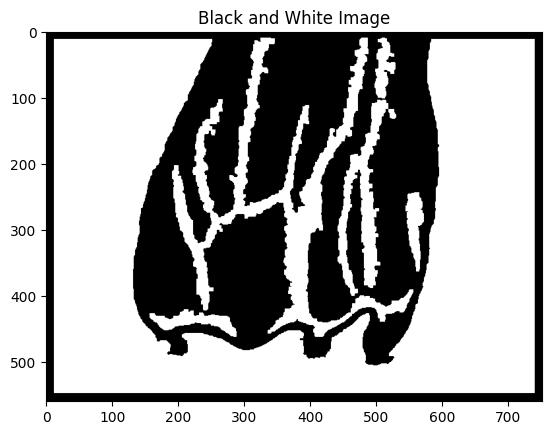

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_005_db1_R1_gray.png


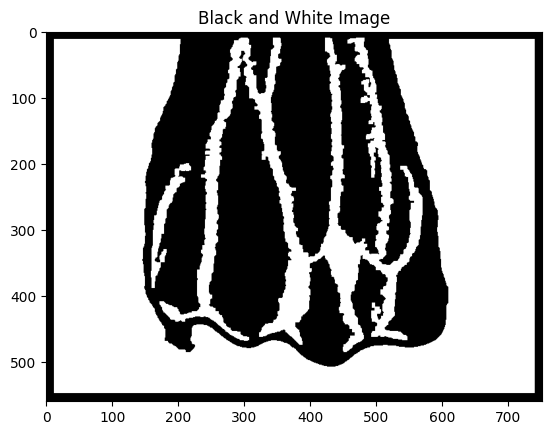

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_005_db1_R2_gray.png


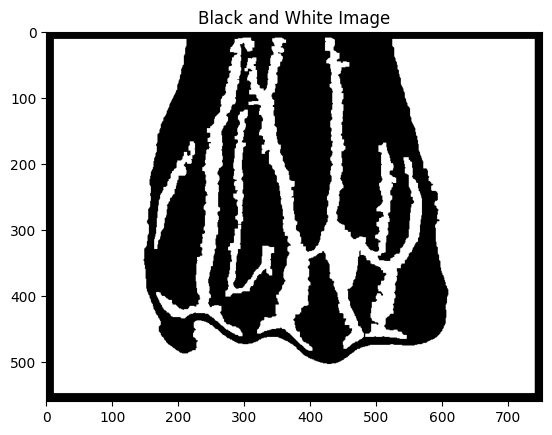

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_005_db1_R3_gray.png


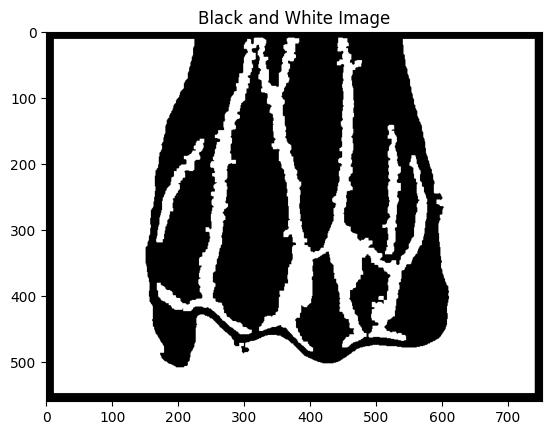

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_005_db1_R4_gray.png


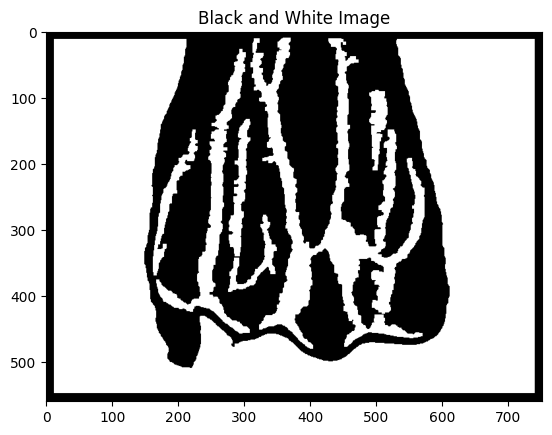

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_006_db1_L1_gray.png


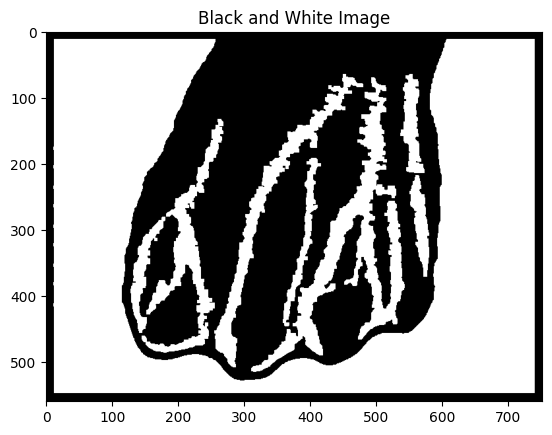

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_006_db1_L2_gray.png


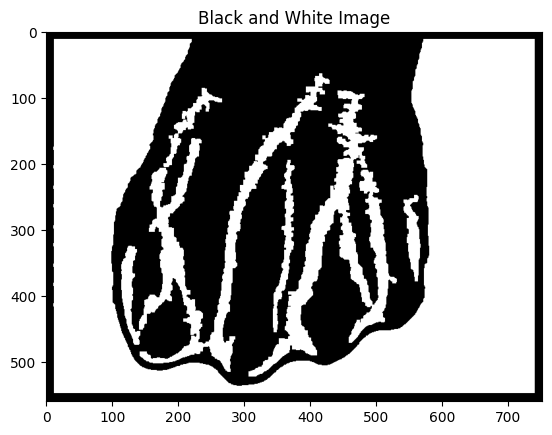

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_006_db1_L3_gray.png


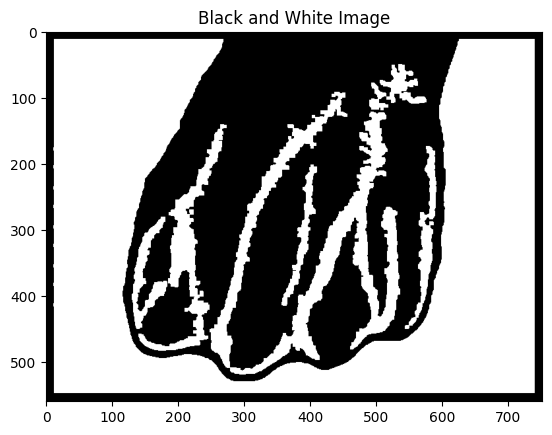

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_006_db1_L4_gray.png


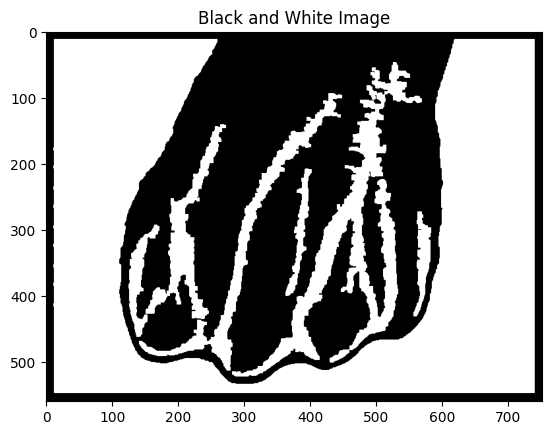

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_006_db1_R1_gray.png


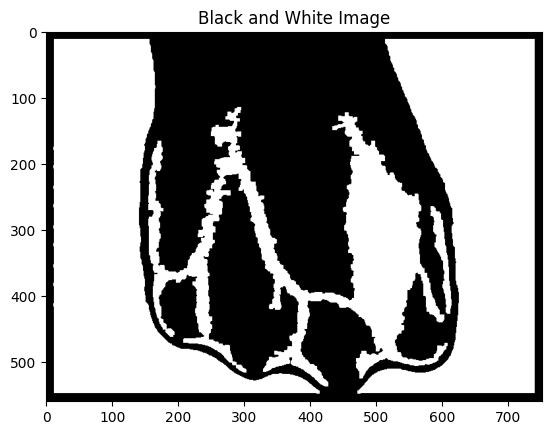

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_006_db1_R2_gray.png


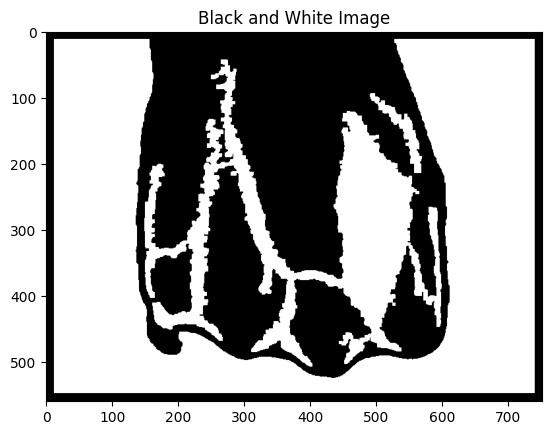

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_006_db1_R3_gray.png


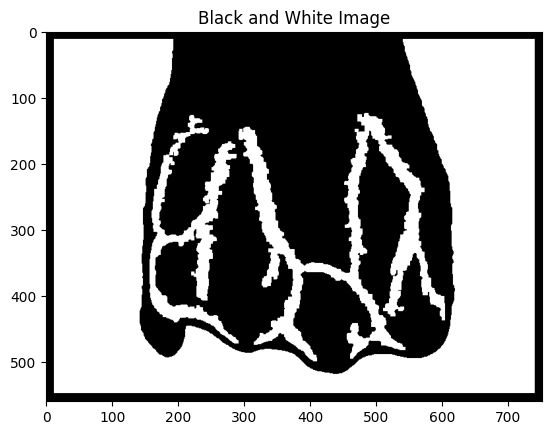

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_006_db1_R4_gray.png


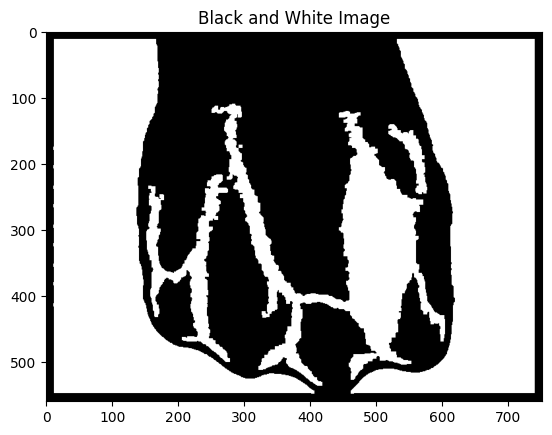

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_007_db1_L1_gray.png


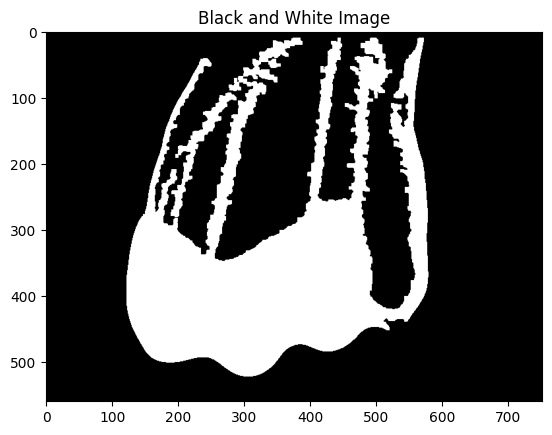

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_007_db1_L2_gray.png


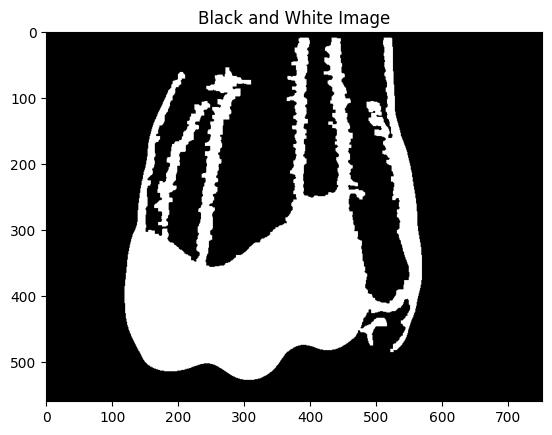

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_007_db1_L3_gray.png


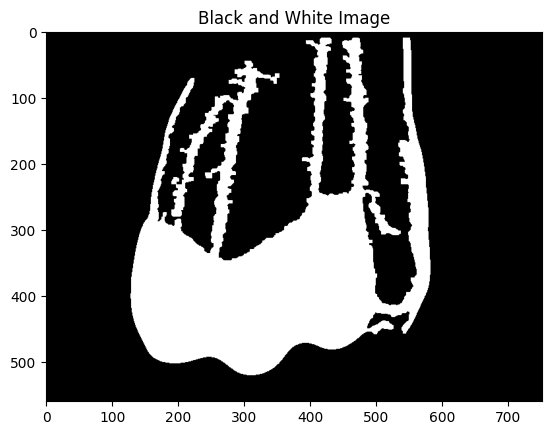

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_007_db1_L4_gray.png


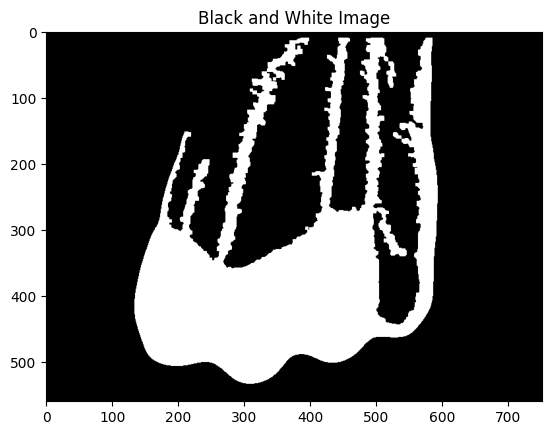

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_007_db1_R1_gray.png


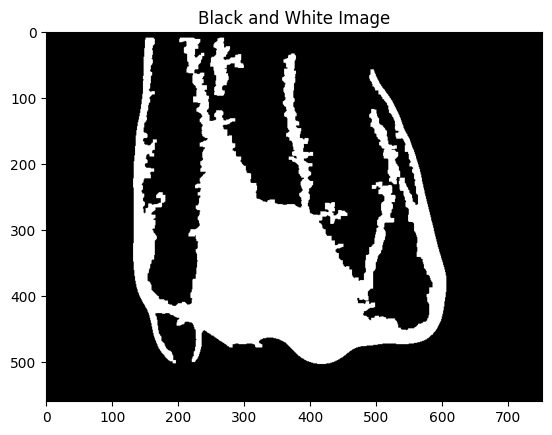

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_007_db1_R2_gray.png


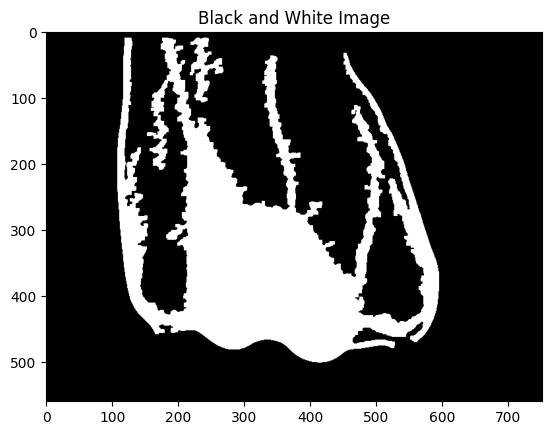

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_007_db1_R3_gray.png


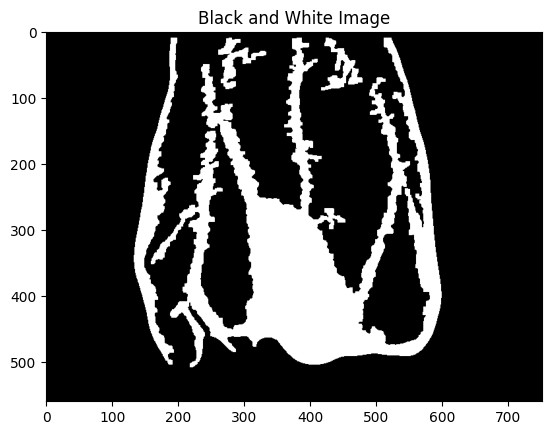

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_007_db1_R4_gray.png


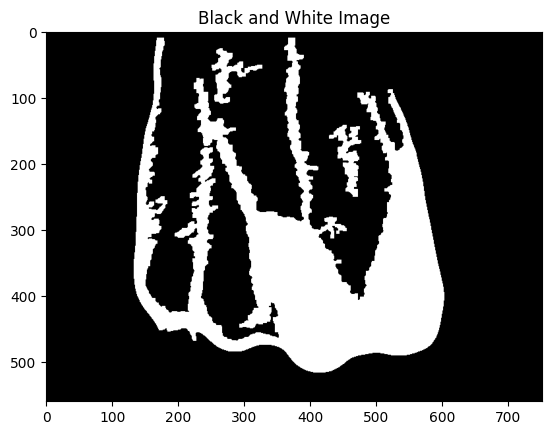

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_008_db1_L1_gray.png


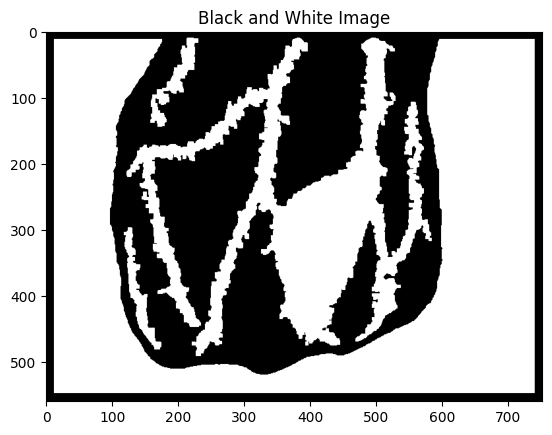

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_008_db1_L2_gray.png


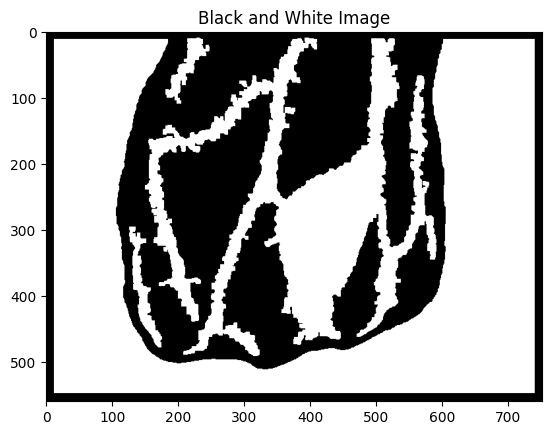

Image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png\person_008_db1_L3_gray.png


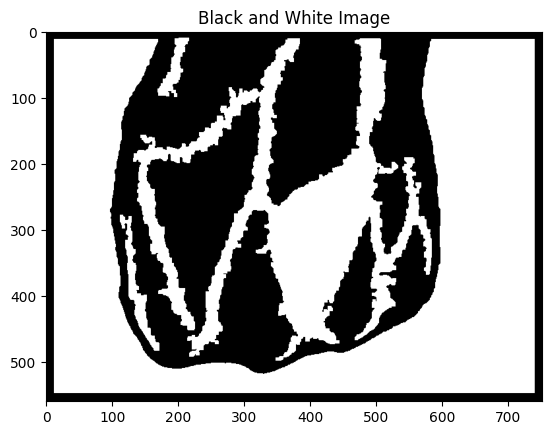

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define the directory containing the images
image_directory = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-binary\DorsalHandVeins_DB1_png"

# Define the directory to save the processed images
save_directory = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png"

# List all the image files in the directory
image_files = os.listdir(image_directory)

# Sort the image files
image_files.sort()

# Process the first 10 images
for image_file in image_files[:60]:
    # Construct the full path to the image
    image_path = os.path.join(image_directory, image_file)
    
    # Read the original color image
    color_image = cv2.imread(image_path)

    # Convert color image to grayscale
    gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian smoothing
    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

    # Thresholding methods
    _, binary_thresh = cv2.threshold(blurred_image, 120, 255, cv2.THRESH_BINARY)

    # Morphological operations to remove noise
    kernel = np.ones((5, 5), np.uint8)
    cleaned_binary_thresh = cv2.morphologyEx(binary_thresh, cv2.MORPH_OPEN, kernel)

    # Find contours to identify connected components
    contours, _ = cv2.findContours(cleaned_binary_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter out small contours (noise) and create a mask for the veins
    vein_mask = np.zeros_like(cleaned_binary_thresh)
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 1500:  # Adjust this threshold based on the size of the veins
            cv2.drawContours(vein_mask, [contour], -1, 255, -1)

    # Create a red mask for filling
    red_mask = np.zeros_like(color_image)
    red_mask[:] = (0, 0, 255)  # Set red color

    # Fill white areas (veins) with red
    filled_image = np.where(vein_mask[..., None], red_mask, color_image)

    # Convert to HSV color space
    hsv_image = cv2.cvtColor(filled_image, cv2.COLOR_BGR2HSV)

    # Define lower and upper bounds for red color in HSV
    lower_red = np.array([0, 100, 100])
    upper_red = np.array([10, 255, 255])

    # Create a mask for red color
    red_mask = cv2.inRange(hsv_image, lower_red, upper_red)

    # Apply bitwise AND operation to retain only red areas
    red_only = cv2.bitwise_and(filled_image, filled_image, mask=red_mask)

    # Convert red areas to white and the rest to black
    red_only[np.where((red_only == [0, 0, 255]).all(axis=2))] = [255, 255, 255]
    red_only[np.where((red_only != [255, 255, 255]).any(axis=2))] = [0, 0, 0]

    # Convert to grayscale
    final_image = cv2.cvtColor(red_only, cv2.COLOR_BGR2GRAY)

    # Construct the full path to save the processed image
    save_path = os.path.join(save_directory, image_file)

    # Save the processed image
    cv2.imwrite(save_path, final_image)

    print(f"Image saved as: {save_path}")

    # Visualize the result
    plt.imshow(final_image, cmap='gray')
    plt.title('Black and White Image')
    plt.show()


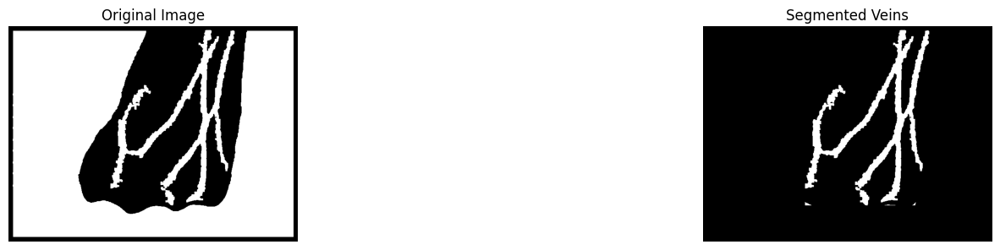

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L1_binary.png


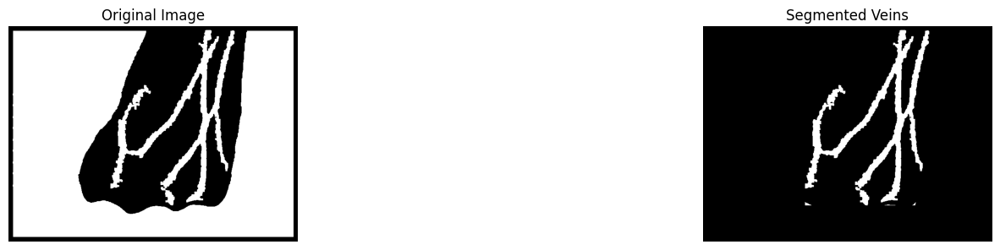

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L1_bw.png


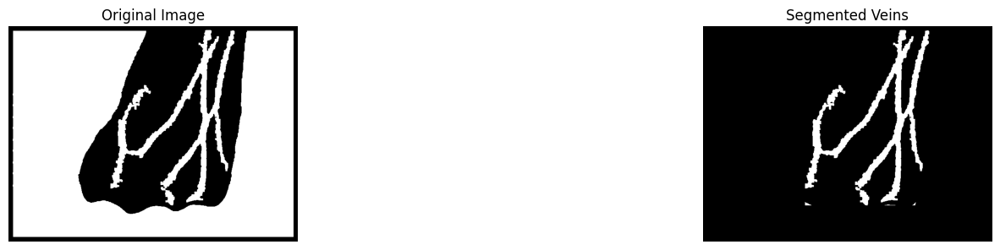

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L1_gray.png


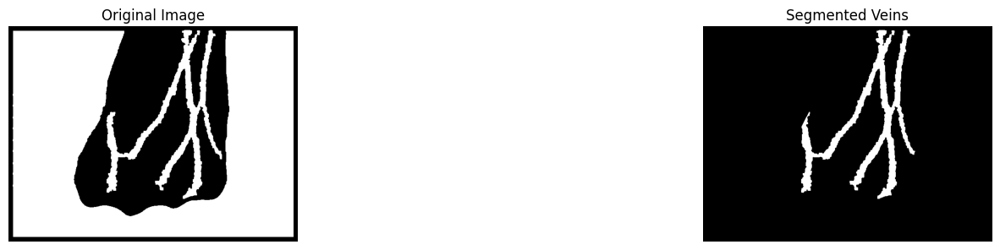

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L2_gray.png


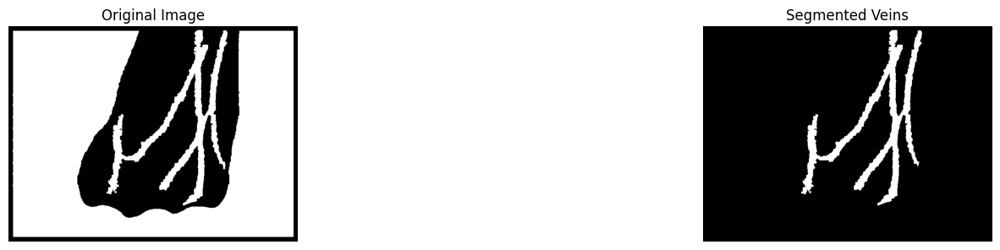

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L3_gray.png


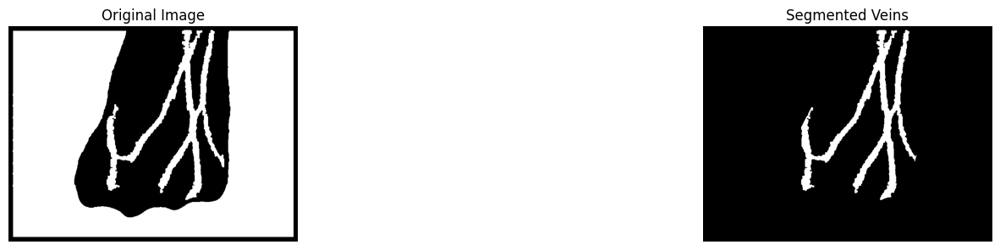

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L4_gray.png


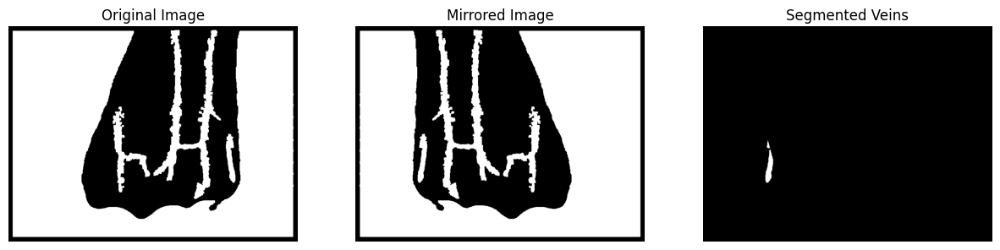

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_R1_gray.png


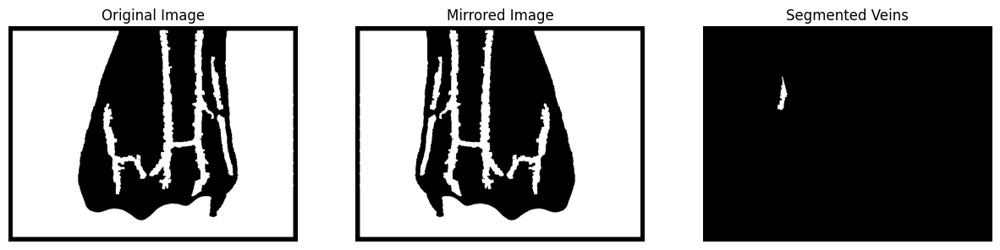

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_R2_gray.png


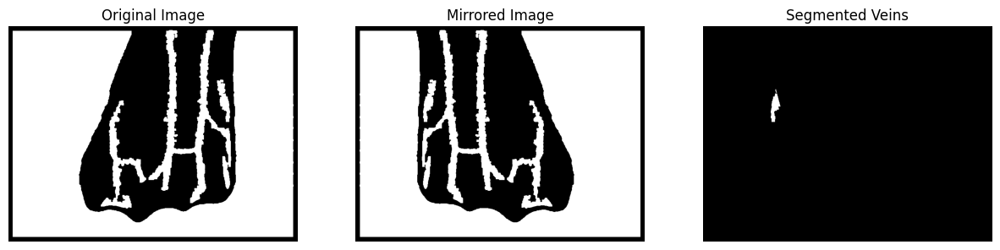

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_R3_gray.png


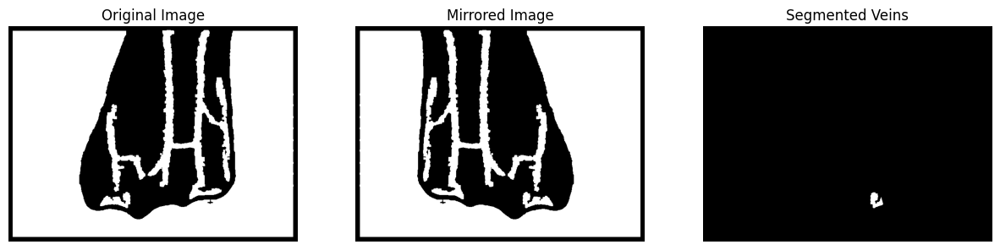

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_R4_gray.png


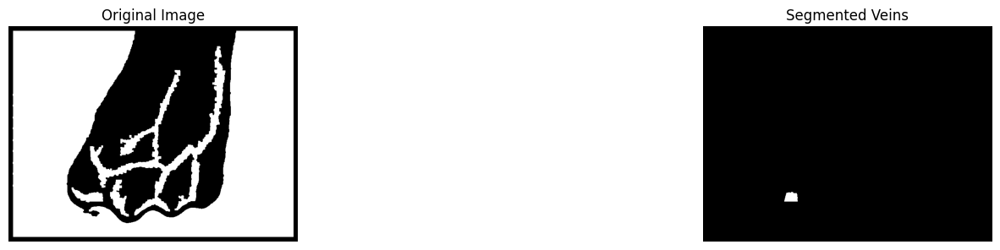

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_002_db1_L1_gray.png


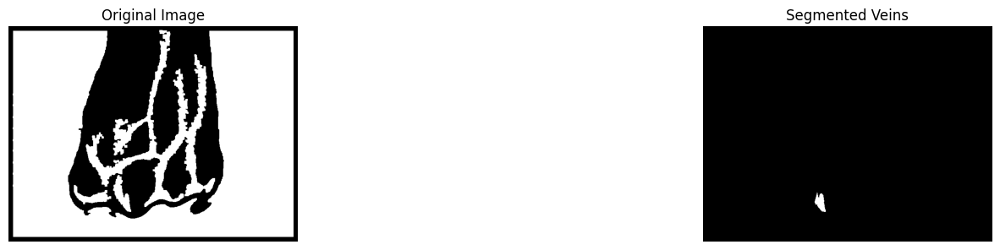

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_002_db1_L2_gray.png


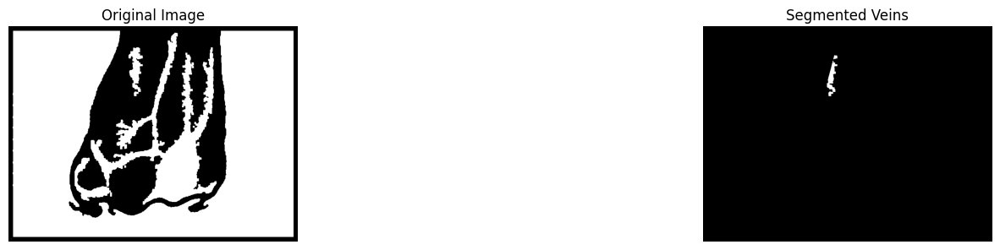

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_002_db1_L3_gray.png


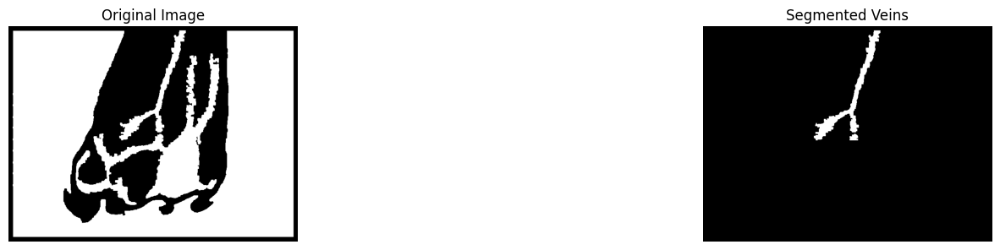

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_002_db1_L4_gray.png


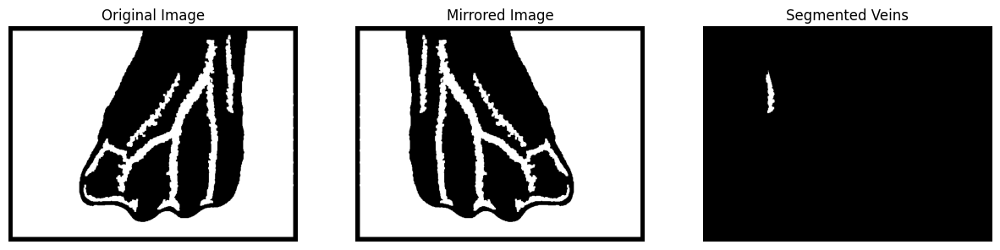

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_002_db1_R1_gray.png


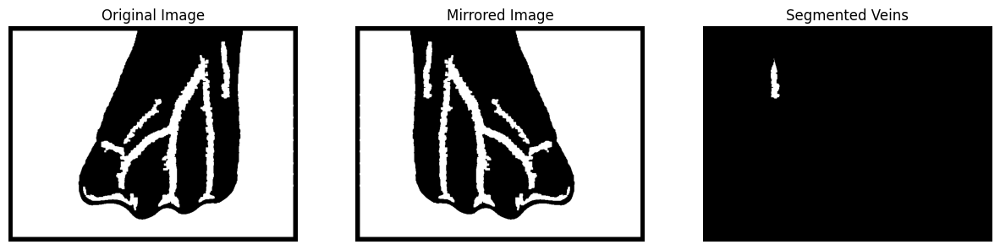

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_002_db1_R2_gray.png


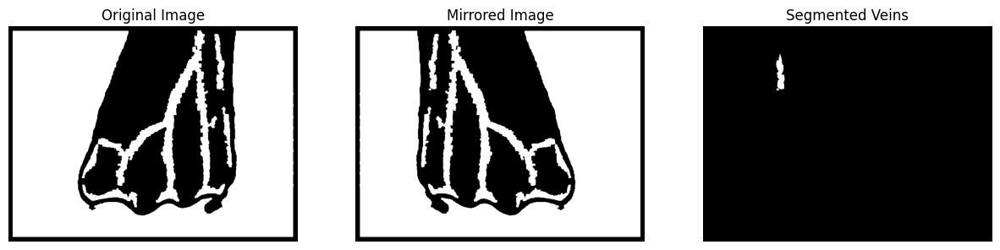

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_002_db1_R3_gray.png


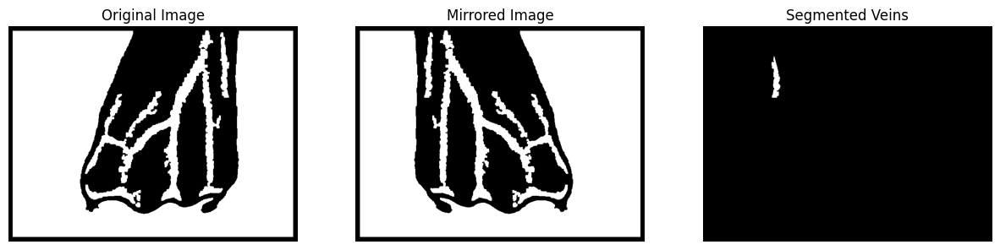

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_002_db1_R4_gray.png


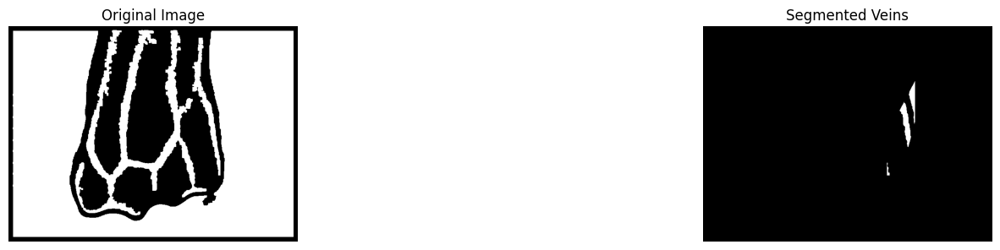

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_003_db1_L1_gray.png


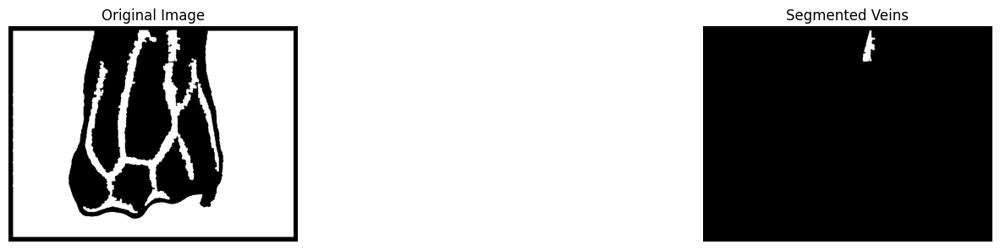

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_003_db1_L2_gray.png


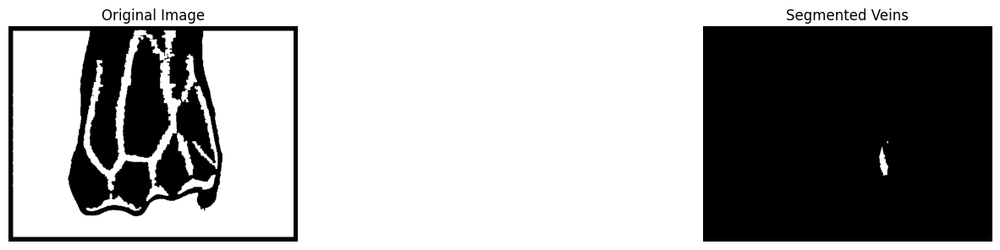

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_003_db1_L3_gray.png


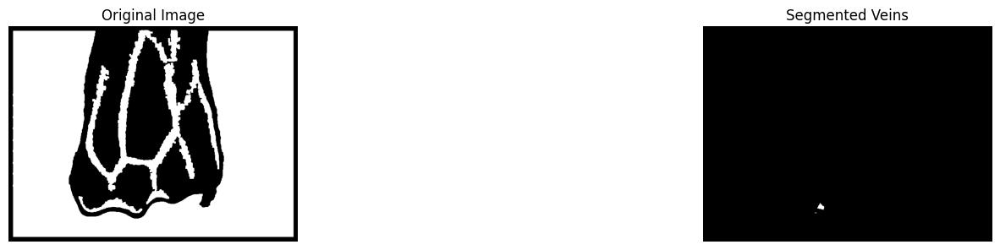

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_003_db1_L4_gray.png


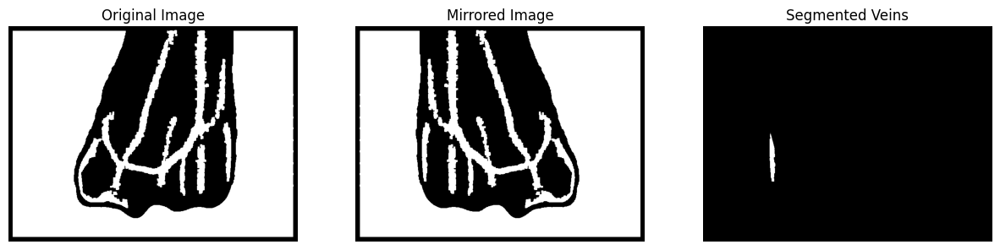

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_003_db1_R1_gray.png


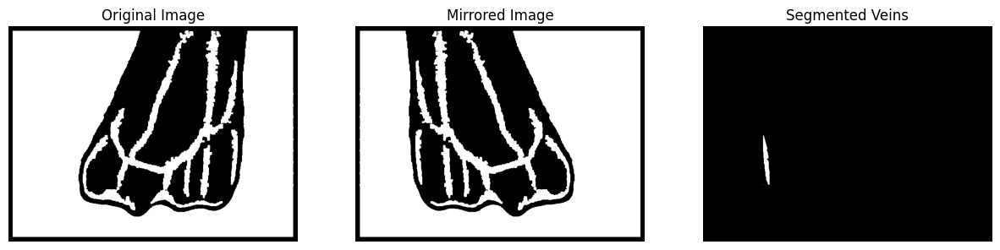

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_003_db1_R2_gray.png


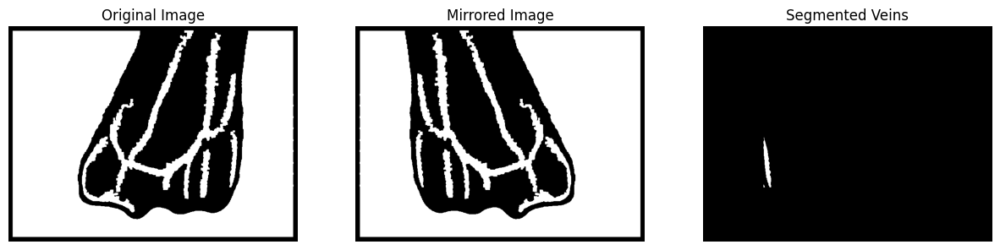

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_003_db1_R3_gray.png


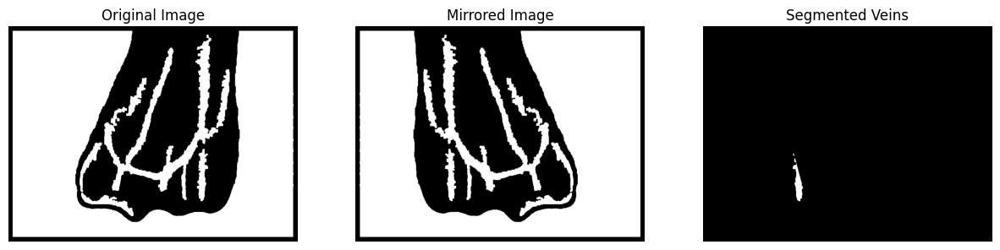

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_003_db1_R4_gray.png


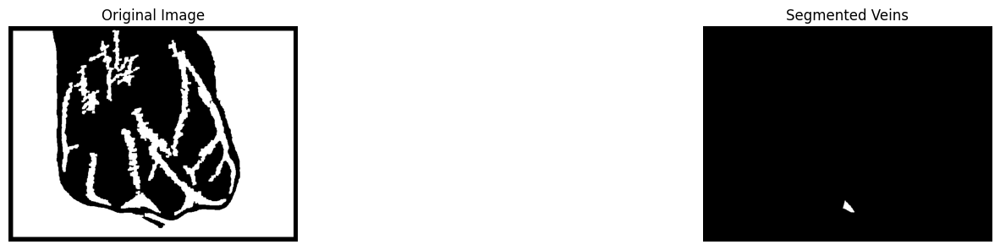

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_004_db1_L1_gray.png


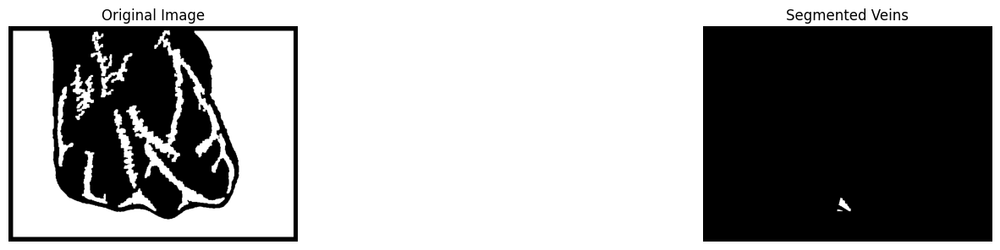

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_004_db1_L2_gray.png


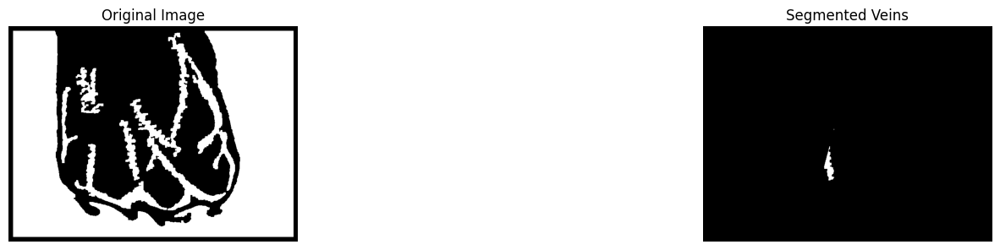

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_004_db1_L3_gray.png


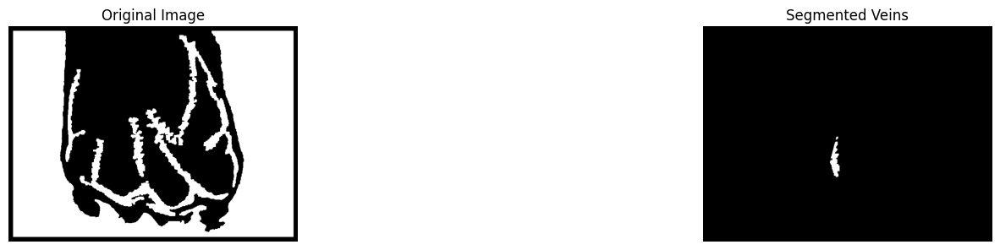

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_004_db1_L4_gray.png


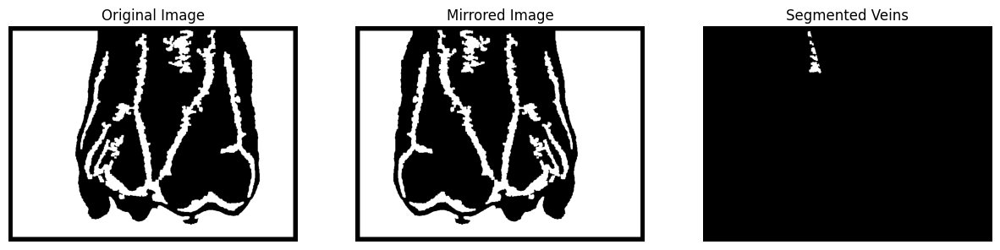

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_004_db1_R1_gray.png


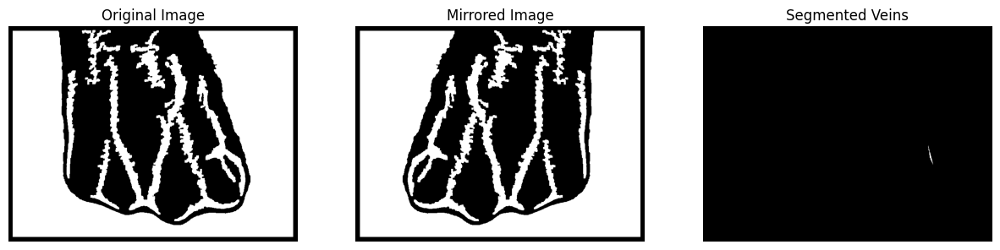

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_004_db1_R2_gray.png


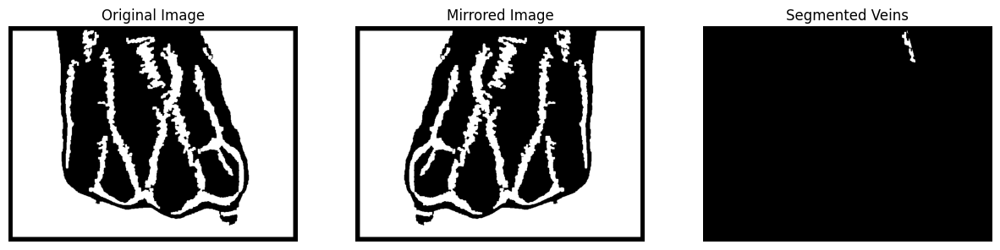

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_004_db1_R3_gray.png


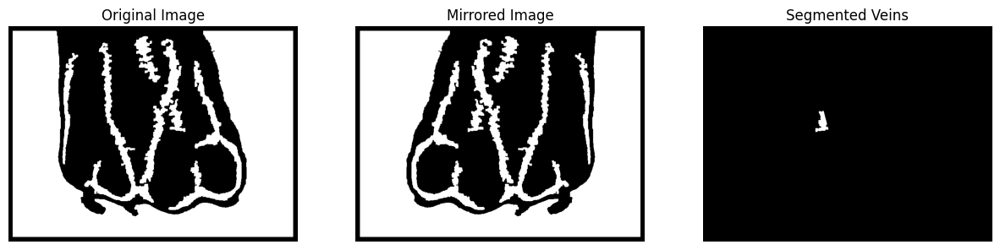

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_004_db1_R4_gray.png


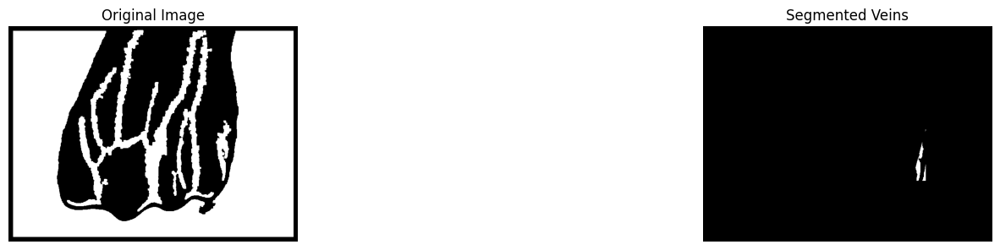

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_005_db1_L1_gray.png


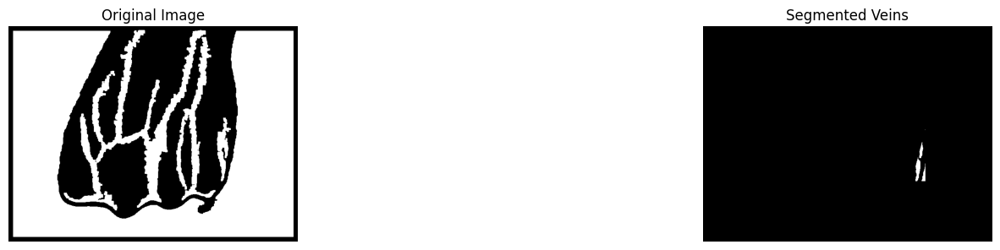

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_005_db1_L2_gray.png


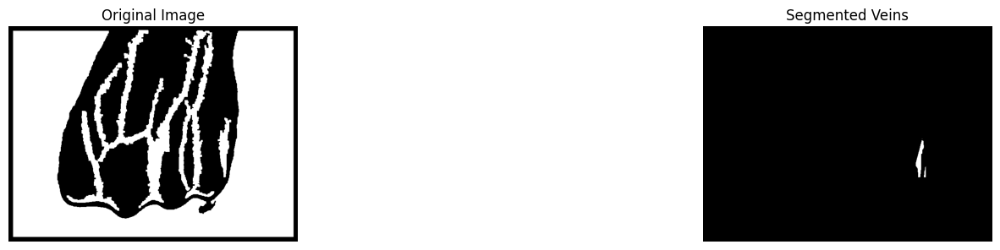

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_005_db1_L3_gray.png


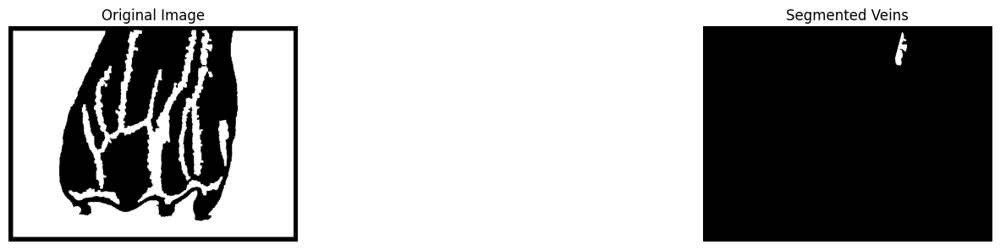

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_005_db1_L4_gray.png


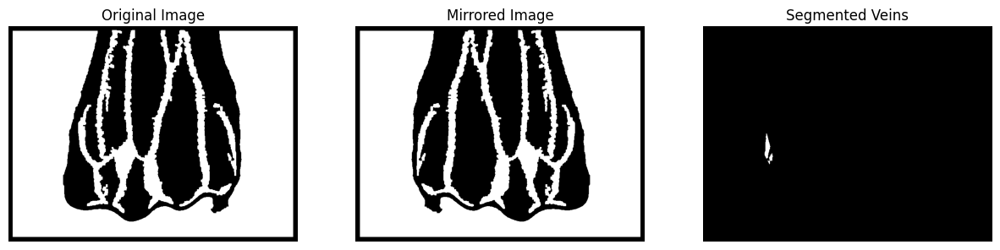

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_005_db1_R1_gray.png


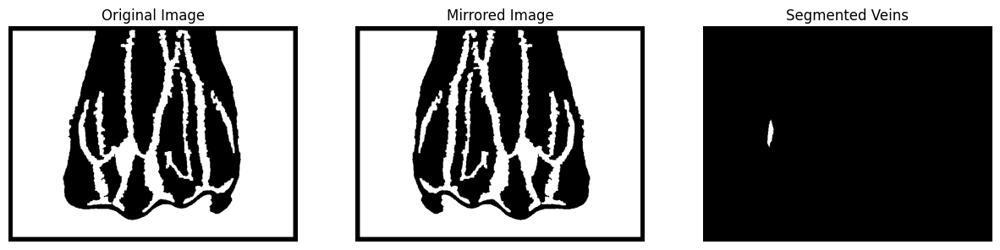

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_005_db1_R2_gray.png


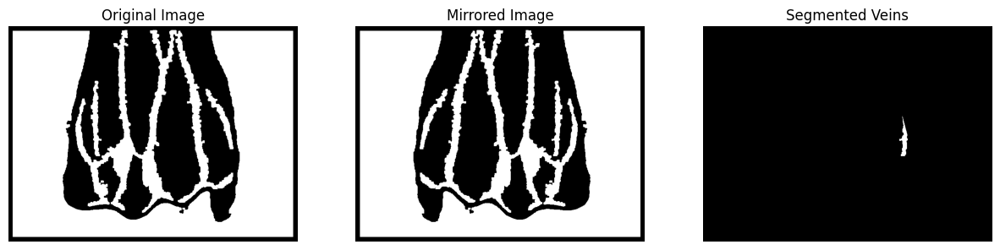

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_005_db1_R3_gray.png


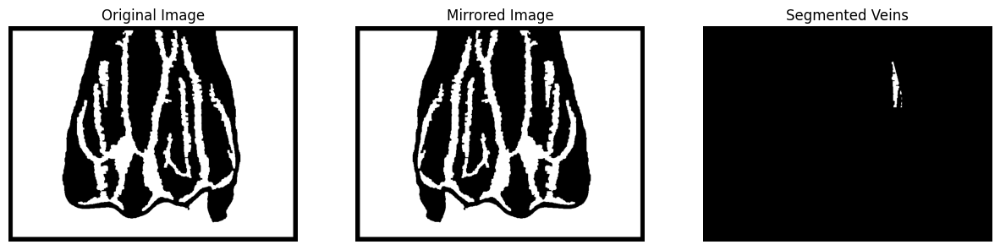

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_005_db1_R4_gray.png


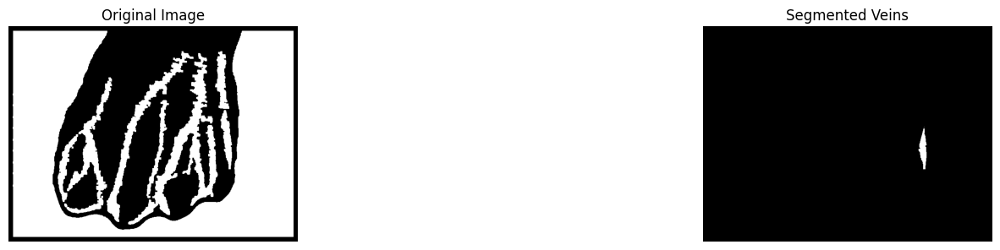

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_006_db1_L1_gray.png


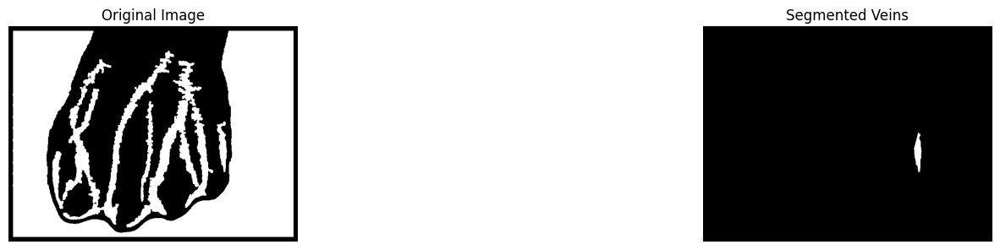

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_006_db1_L2_gray.png


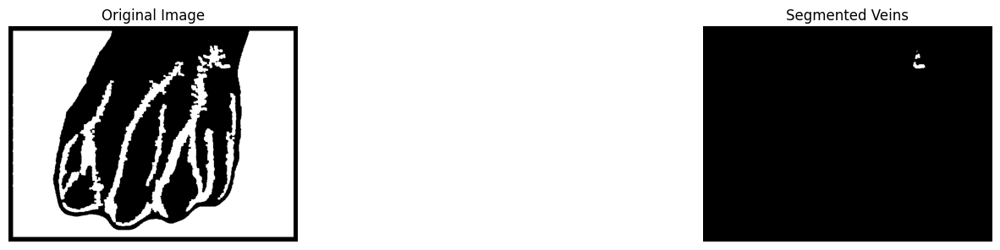

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_006_db1_L3_gray.png


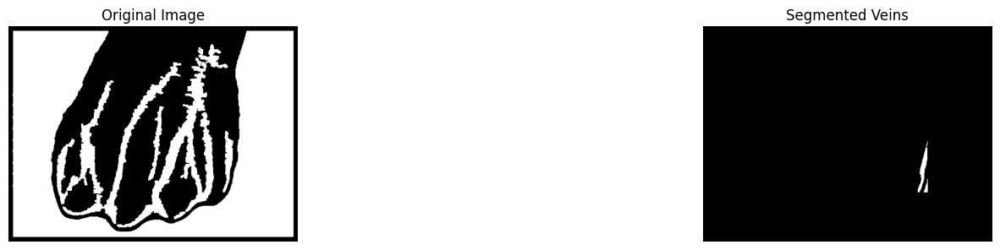

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_006_db1_L4_gray.png


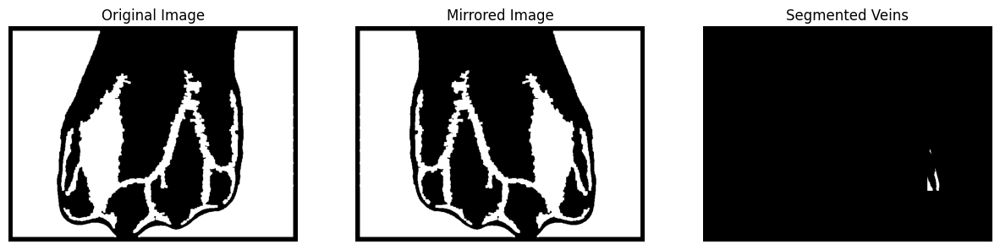

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_006_db1_R1_gray.png


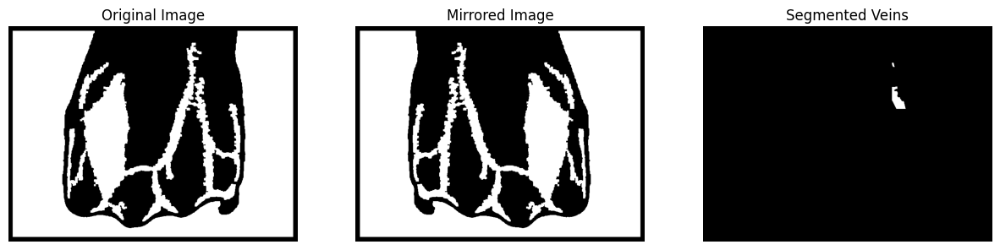

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_006_db1_R2_gray.png


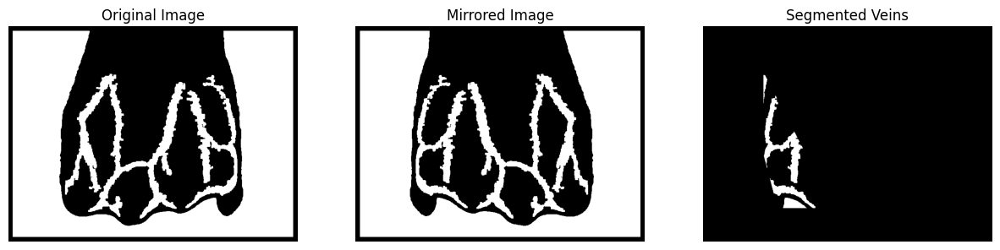

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_006_db1_R3_gray.png


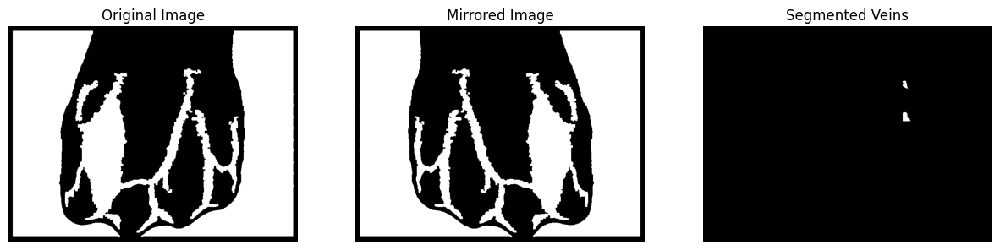

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_006_db1_R4_gray.png


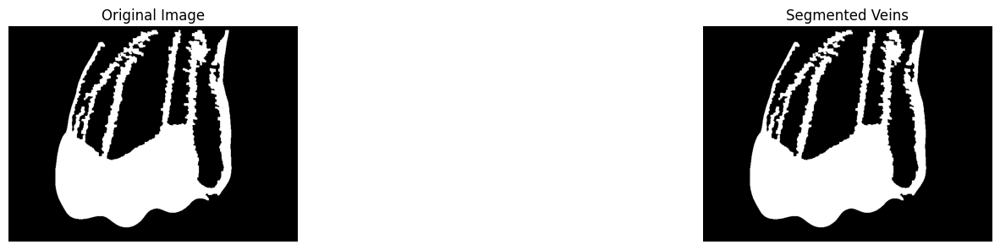

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_007_db1_L1_gray.png


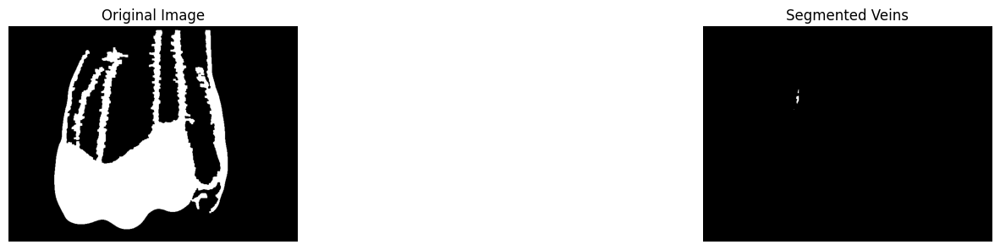

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_007_db1_L2_gray.png


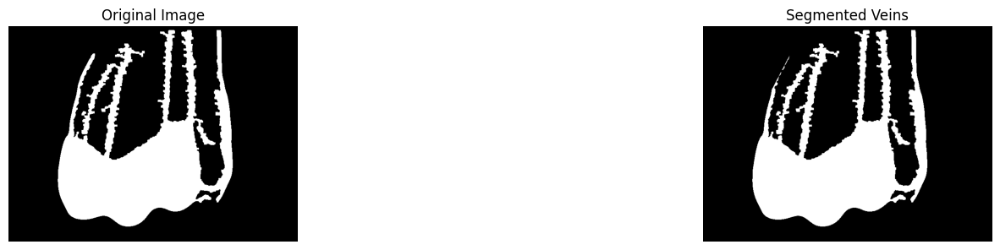

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_007_db1_L3_gray.png


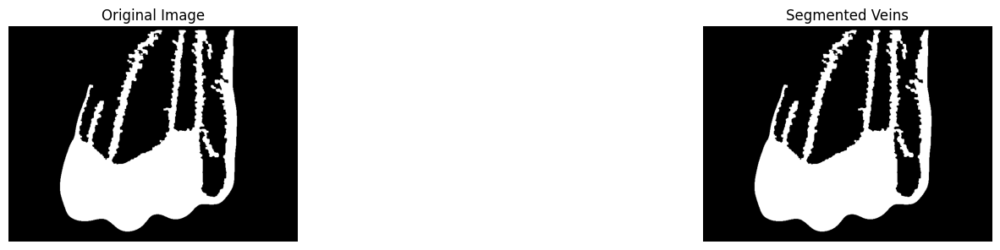

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_007_db1_L4_gray.png


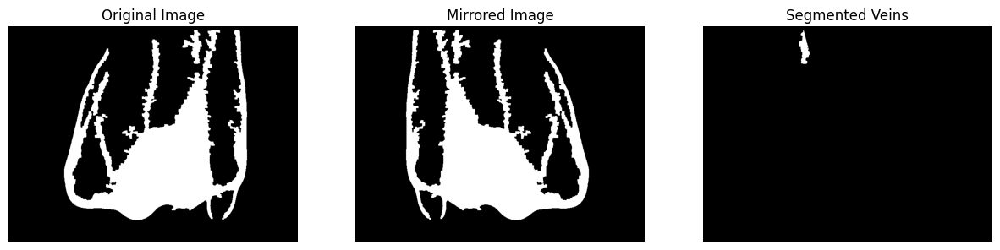

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_007_db1_R1_gray.png


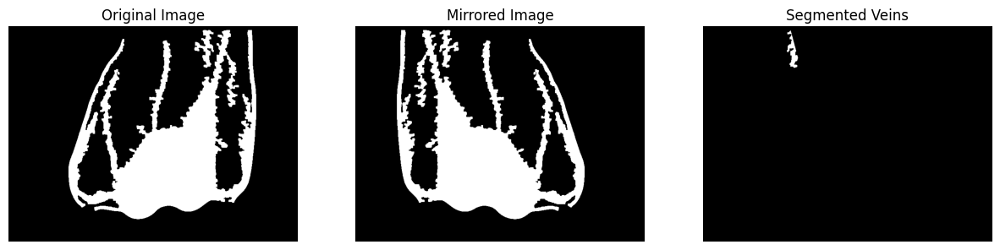

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_007_db1_R2_gray.png


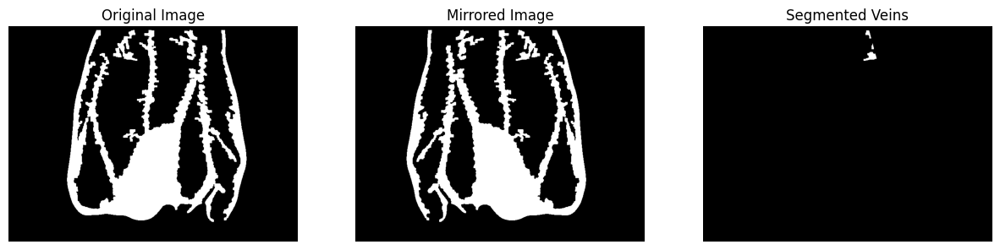

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_007_db1_R3_gray.png


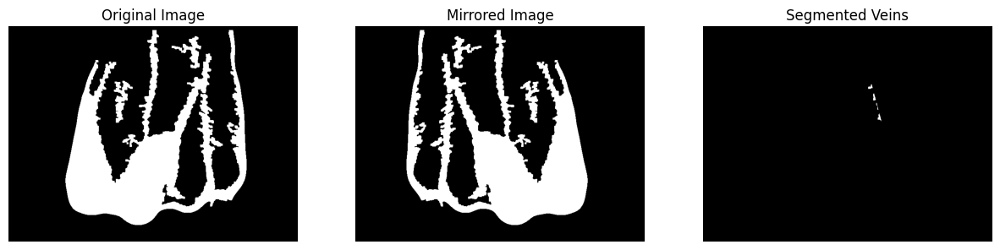

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_007_db1_R4_gray.png


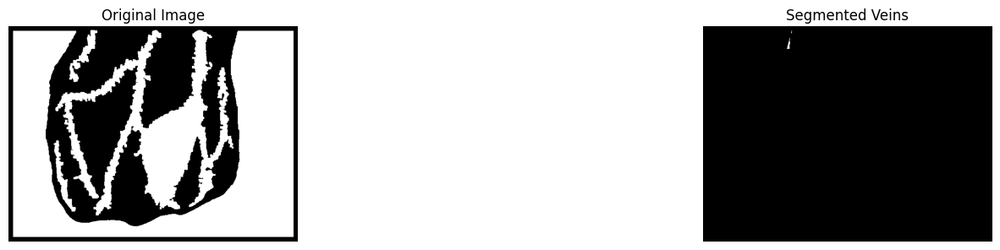

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_008_db1_L1_gray.png


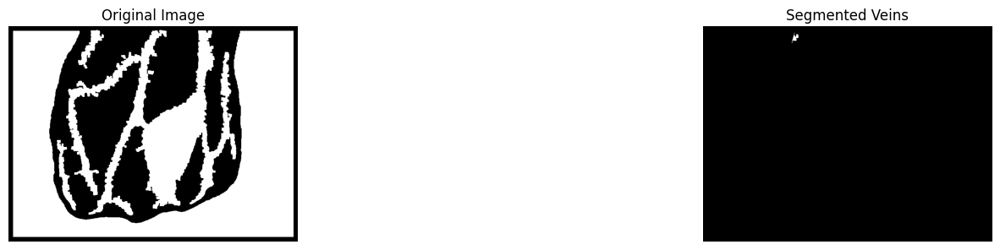

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_008_db1_L2_gray.png


In [10]:
import cv2
import os
import re
import matplotlib.pyplot as plt

def preprocess_image(image):
    # Apply Gaussian blur to reduce noise and enhance edges
    img_blur = cv2.GaussianBlur(image, (5, 5), 0)
    return img_blur

def segment_veins(image):
    # Preprocess the image
    img = preprocess_image(image)
    
    # Apply thresholding to segment the veins
    _, thresholded = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Find contours in the binary image
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Get the bounding boxes for all contours
    bounding_boxes = [cv2.boundingRect(contour) for contour in contours]
    
    # Find the smallest bounding box
    min_x, min_y, min_w, min_h = min(bounding_boxes, key=lambda box: box[2] * box[3])
    
    # Create a blank black image
    black_image = np.zeros_like(image)
    
    # Fill the region inside the smallest bounding box with the original pixel values
    black_image[min_y:min_y + min_h, min_x:min_x + min_w] = image[min_y:min_y + min_h, min_x:min_x + min_w]
    
    # Create a triangular mask
    triangle_mask = np.ones_like(black_image) * 255
    triangle_vertices_top_left = np.array([[min_x, min_y], [min_x, min_y + 250], [min_x + 130, min_y]], dtype=np.int32)
    triangle_vertices_bottom_right = np.array([[min_x + min_w - 37, min_y + min_h], [min_x + min_w, min_y + min_h], [min_x + min_w, min_y + min_h - 140]], dtype=np.int32)
    
    # Draw the filled triangles
    cv2.drawContours(black_image, [triangle_vertices_top_left, triangle_vertices_bottom_right], -1, (0, 0, 0), thickness=cv2.FILLED)
    
    return thresholded, black_image

# Define the directory containing the images
image_directory = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png"

# Define the directory to save the processed images
save_directory = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png"

# List all the image files in the directory
image_files = os.listdir(image_directory)

# Sort the image files
image_files.sort()

# Process the first 10 images
for image_file in image_files[:60]:
    # Construct the full path to the image
    image_path = os.path.join(image_directory, image_file)
    
    # Read the original grayscale image
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Check if the image filename contains "_R" followed by one or more digits
    if re.search(r"_R\d+", image_file):
        # If so, mirror the image horizontally
        original_image = cv2.flip(original_image, 1)
        is_mirrored = True
    else:
        is_mirrored = False
    
    # Segment the veins
    binary_thresholded, segmented_image = segment_veins(original_image)
    
    # Check if the image was mirrored before segmentation
    if is_mirrored:
        # If so, mirror the segmented image back
        segmented_image = cv2.flip(segmented_image, 1)
    
    # Construct the full path to save the processed image
    save_path = os.path.join(save_directory, image_file)
    
    # Save the segmented image
    cv2.imwrite(save_path, segmented_image)
    
    # Plot the original, mirrored, and segmented images
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')
    
    if is_mirrored:
        plt.subplot(1, 3, 2)
        plt.imshow(cv2.flip(original_image, 1), cmap='gray')
        plt.title('Mirrored Image')
        plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(segmented_image, cmap='gray')
    plt.title('Segmented Veins')
    plt.axis('off')
    
    plt.show()
    
    print(f"Segmented image saved as: {save_path}")


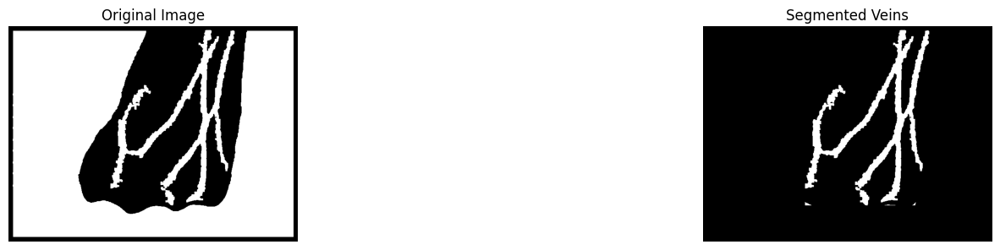

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L1_binary.png


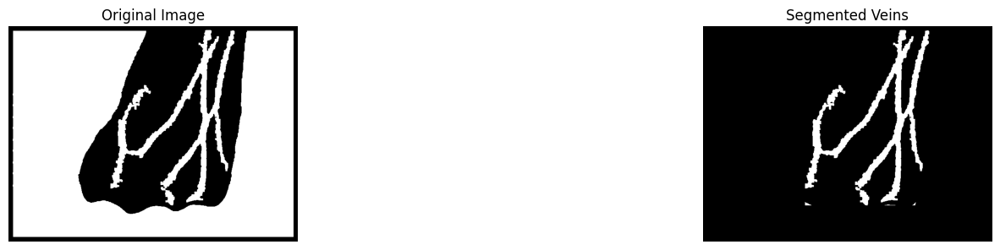

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L1_bw.png


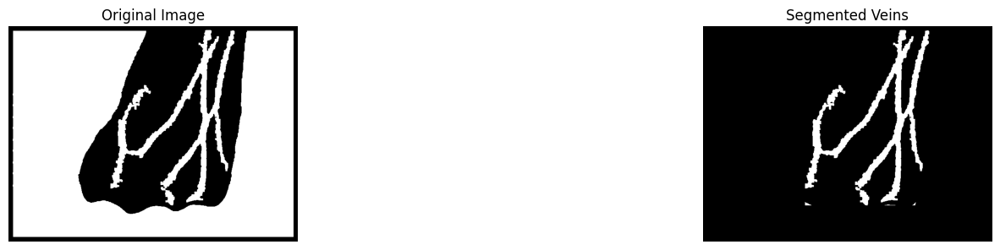

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L1_gray.png


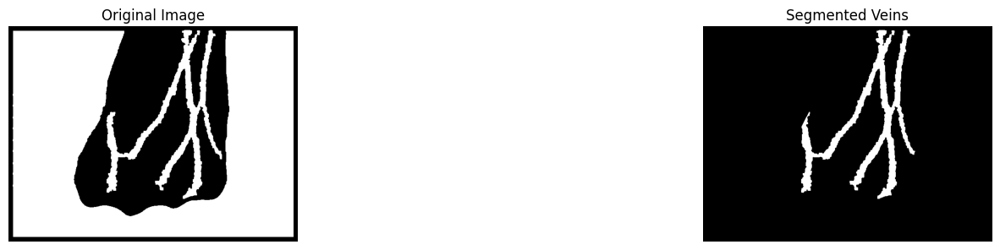

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L2_gray.png


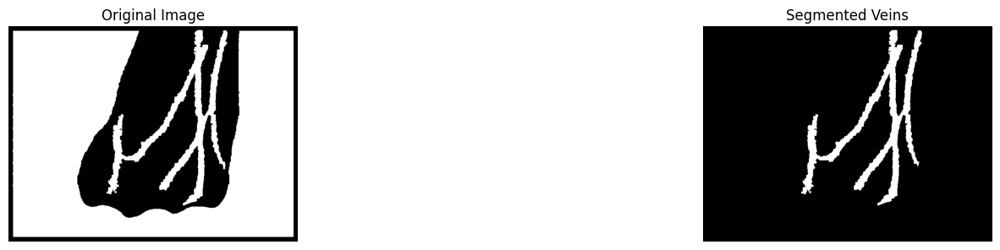

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L3_gray.png


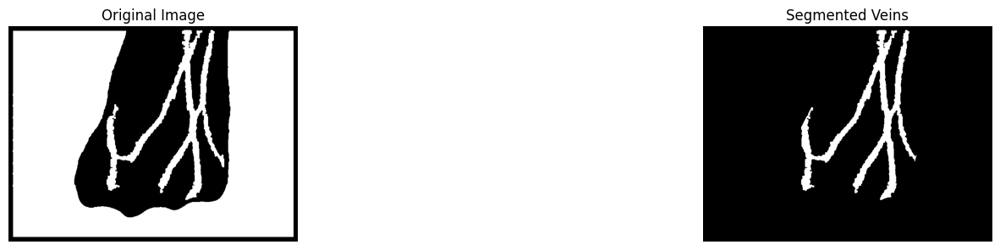

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_L4_gray.png


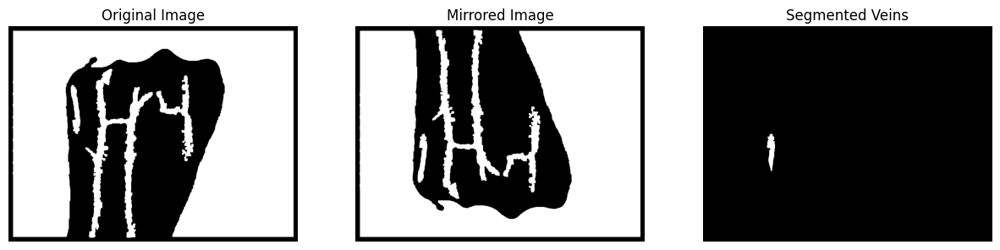

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_R1_gray.png


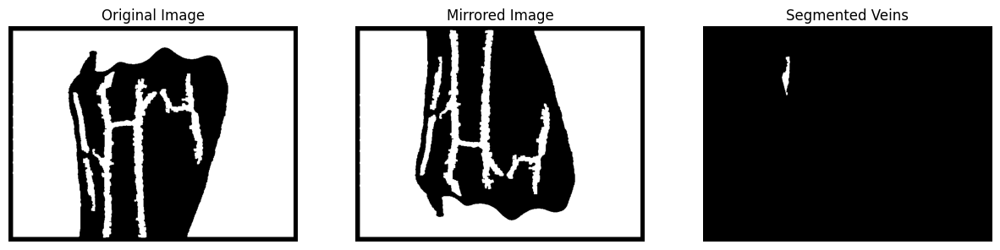

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_R2_gray.png


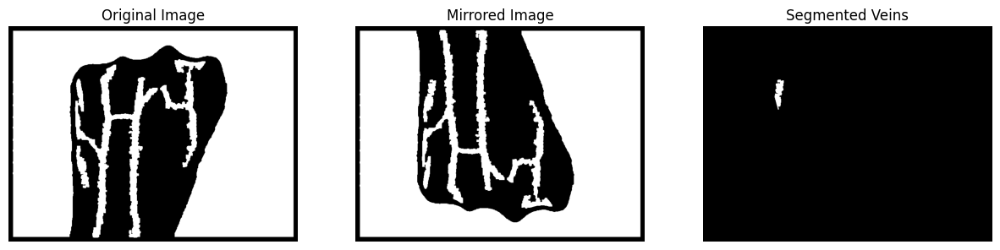

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_R3_gray.png


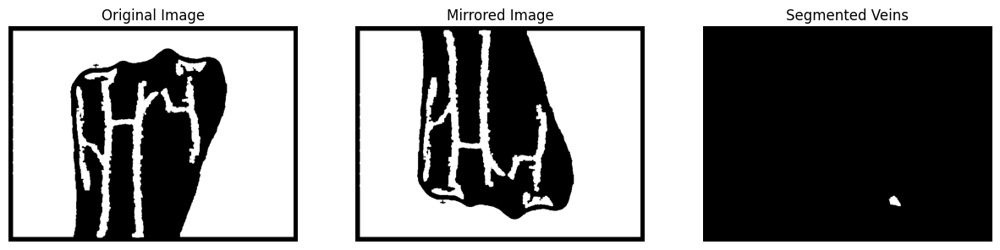

Segmented image saved as: C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png\person_001_db1_R4_gray.png


In [6]:
import cv2
import os
import re
import matplotlib.pyplot as plt

def preprocess_image(image):
    # Apply Gaussian blur to reduce noise and enhance edges
    img_blur = cv2.GaussianBlur(image, (5, 5), 0)
    return img_blur

def segment_veins(image):
    # Preprocess the image
    img = preprocess_image(image)
    
    # Apply thresholding to segment the veins
    _, thresholded = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Find contours in the binary image
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Get the bounding boxes for all contours
    bounding_boxes = [cv2.boundingRect(contour) for contour in contours]
    
    # Find the smallest bounding box
    min_x, min_y, min_w, min_h = min(bounding_boxes, key=lambda box: box[2] * box[3])
    
    # Create a blank black image
    black_image = np.zeros_like(image)
    
    # Fill the region inside the smallest bounding box with the original pixel values
    black_image[min_y:min_y + min_h, min_x:min_x + min_w] = image[min_y:min_y + min_h, min_x:min_x + min_w]
    
    # Create a triangular mask
    triangle_mask = np.ones_like(black_image) * 255
    triangle_vertices_top_left = np.array([[min_x, min_y], [min_x, min_y + 250], [min_x + 130, min_y]], dtype=np.int32)
    triangle_vertices_bottom_right = np.array([[min_x + min_w - 37, min_y + min_h], [min_x + min_w, min_y + min_h], [min_x + min_w, min_y + min_h - 140]], dtype=np.int32)
    
    # Draw the filled triangles
    cv2.drawContours(black_image, [triangle_vertices_top_left, triangle_vertices_bottom_right], -1, (0, 0, 0), thickness=cv2.FILLED)
    
    return thresholded, black_image

# Define the directory containing the images
image_directory = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-bw\DorsalHandVeins_DB1_png"

# Define the directory to save the processed images
save_directory = r"C:\Downloads\dorsalhandveins-main\dorsalhandveins-seg\DorsalHandVeins_DB1_png"

# List all the image files in the directory
image_files = os.listdir(image_directory)

# Sort the image files
image_files.sort()

# Process the first 10 images
for image_file in image_files[:10]:
    # Construct the full path to the image
    image_path = os.path.join(image_directory, image_file)
    
    # Read the original grayscale image
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Check if the image filename contains "_R" followed by one or more digits
    if re.search(r"_R\d+", image_file):
        # If so, mirror the image vertically
        original_image = cv2.flip(original_image, 0)
        is_mirrored = True
    else:
        is_mirrored = False
    
    # Segment the veins
    binary_thresholded, segmented_image = segment_veins(original_image)
    
    # Check if the image was mirrored before segmentation
    if is_mirrored:
        # If so, mirror the segmented image back
        segmented_image = cv2.flip(segmented_image, 0)
    
    # Construct the full path to save the processed image
    save_path = os.path.join(save_directory, image_file)
    
    # Save the segmented image
    cv2.imwrite(save_path, segmented_image)
    
    # Plot the original, mirrored, and segmented images
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')
    
    if is_mirrored:
        plt.subplot(1, 3, 2)
        plt.imshow(cv2.flip(original_image, 0), cmap='gray')
        plt.title('Mirrored Image')
        plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(segmented_image, cmap='gray')
    plt.title('Segmented Veins')
    plt.axis('off')
    
    plt.show()
    
    print(f"Segmented image saved as: {save_path}")


In [ ]:
+